# Predicting User Activity Over 1 Month Using Orbit
---
We want to forecast changes in user activity for the next month in order to plan server load.  
For this, we will use Uber's Orbit package as a forecasting tool.

## Main Question:
- What is the most likely load dynamics (lower and upper bounds) for the next month?

## Summary and Conclusion:
1. We found log(active users per hour) to be the best target metric to forecast server load, with logarithm of the hourly views on a unique post as regressor as well as binary regressors coding for anomalities.   
KTR model showed better results than DLT, having more stable and sensible predicted trends.   
21-day forecast provides an optimal blend of time and error, whereas a 30-day forecast yielded less efficient estimates.

2. For this model-time-regressor combination, we produced three types of forecasts depending on how our regressor metric behaves:
   - a 'low load' scenario where the minimum load over 21 days will reach **500** users per hour (lower bound of the confidence interval)
   - a 'medium load' scenario where the most probable load will amount to **2060** users per hour (forecast median)
   - a 'high load' scenario where the load will not exceed **4300** users per hour (upper bound of the confidence interval)


## Major Steps:
1. Choosing a metric for forecasting, time granularity (days? hours?), and regressors.
- Which metric best describes the load? Which time granularity works better - hourly or daily? Are there any regressors that can improve the forecast?

2. Building models, validating, backcasting.
- Which model performs best?
3. Choosing the forecasting window.
- How long in future can we predict?


## Table of Contents

[**Imports, functions, global parameters**](#imports-functions-global-parameters) 

[**1. Choosing the metric and time resolution**](#choosing-metric)  

[1.1. Quering and formatting](#quering-and-formatting)  
[1.2. Finding correlating metrics](#finding-correlating-metrics)  
[1.3. Visualizing time series](#visualizing-time-series)  
[1.4. Choosing hourly active user as a metric](#choosing-hourly-active-user)  
[1.5. Choosing regressors](#choosing-regressors)  

[**2. Forecasting the regressor metric**](#forecasting-the-regressor-metric)  

[2.1.1. Creating sub-regressors](#2.1.1-creating-sub-regressors)  
[2.1.2. Creating transformed metrics](#2.1.2-creating-transformed-metrics)  
[2.1.3. Splitting the dataset](#2.1.3-splitting-the-dataset)  
[2.1.4. Setting arguments for a model](#2.1.4-setting-arguments-for-a-model)  
[2.2. views - no regressors - DLT](#2.2-views-no-regressors-dlt)  
[2.3. log(views) - no regressors - DLT](#2.3-log-views-no-regressors-dlt)  
[2.4. log(views) - with regressor - DLT](#2.4-log-views-with-regressor-dlt)  
[2.5. daily views - with regressor - DLT](#2.5-daily-views-with-regressor-dlt)  
[2.6. log(views) - no regressors - KTR](#2.6-log-views-no-regressors-ktr)  
[2.7. log(views) - with regressor - KTR](#2.7-log-views-with-regressor-ktr)  
[2.8. daily views - with regressor - KTR](#2.8-daily-views-with-regressor-ktr)  
[2.9. Summary](#2.9-summary)  
[2.10. Questions and notes](#section-2.10)  

[**3. Optimizing the regressor forecast**](#3-optimizing-the-regressor-forecast)  

[3.1. Backtest of log views, no regressors, DLT](#3.1-backtest-of-log-views-no-regressors-dlt)  
[3.2. Backtest of log views, no regressors, KTR](#3.2-backtest-of-log-views-no-regressors-ktr)  
[3.3. Backtest of daily views, no regressors, DLT](#3.3-backtest-of-daily-views-no-regressors-dlt)  
[3.4. Backtest of views with regressor, DLT](#3.4-backtest-of-views-with-regressor-dlt)  
[3.5. Choosing metric type and the model for the regressor](#3.5-choosing-metric-type-and-the-model-for-the-regressor)  

[**4. Forecasting target metric**](#4-forecasting-target-metric)  

[4.1. target - no regressors - DLT](#4.1-target-no-regressors-dlt)  
[4.2. log(users) - no regressors - DLT](#4.2-log-users-no-regressors-dlt)  
[4.3. Choosing metric type for the target](#4.3-choosing-metric-type-for-the-target)  
[4.4. log(users) - no regressors - KTR](#4.4-log-users-no-regressors-ktr)  
[4.5. log(users) - pessimistic regressor - KTR](#4.5-log-users-pessimistic-regressor-ktr)  
[4.6. smooth log target - optimistic regressor - KTR](#4.6-smooth-log-target-optimistic-regressor-ktr)  
[4.7. Choosing the model type and regressor type](#4.7-choosing-the-model-type-and-regressor-type)  

[5. Conclusions](#5-conclusions)  

## Imports, functions, global parameters <a id="imports-functions-global-parameters"></a>


In [1]:
# start with the imports

# hide a database access password
import os
from dotenv import load_dotenv

import warnings # suppress matplotlib warnings
import logging # suppress long orbit outputs

import numpy as np
import pandas as pd
import swifter # applies any function to a pandas df or series faster
from scipy.stats import boxcox # boxcox transformation for time series
import pandahouse as ph # Connect with clickhouse DB

from statsmodels.tsa.seasonal import STL # time series decomposition

import matplotlib # visualization
import matplotlib.pyplot as plt 
import seaborn as sns

/Users/dmitrii.shiriaev/miniconda3/envs/kc-da-sl/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import orbit # forecasting
from orbit.models import DLT, KTR # models to be tested 
from orbit.diagnostics.plot import plot_predicted_data, plot_predicted_components, plot_bt_predictions # forecast visualization
from orbit.diagnostics.backtest import BackTester # backtesting 
from orbit.utils.params_tuning import grid_search_orbit # gridsearch for parameters optimization

In [3]:
# Load environment variables from .env file
load_dotenv(dotenv_path='../.env')

# introduce the secret variable to connect to the db
DA_SL_PWD = os.environ.get('DA_SL_PWD')

# set the connection with the db
CONNECTION = {
    'host': 'https://clickhouse.lab.karpov.courses',
    'database':'simulator_20230720',
    'user':'student', 
    'password':DA_SL_PWD
    }

# define the name of the schema
feed_db = 'simulator_20230720.feed_actions'

In [4]:
# suppress pallette and font-related matplotlib warnings
warnings.filterwarnings('ignore', category=UserWarning)
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)
logging.getLogger('orbit').setLevel(logging.ERROR)

In [5]:
# set the default figure quality and size
plt.rcParams['figure.dpi'] = 100 
plt.rcParams['figure.figsize'] = (9, 4)

In [6]:
# make pandas show less digits for floats
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [7]:
# Create a function that plots a lineplot on a given grid
def lineplotter(
    data: pd.DataFrame,
    x: str,
    y: str,
    ax,
    hue: str = None,
    title: str = None,
    xlabel: str = None,
    ylabel: str = None,
    legend: bool = True
    ) -> None:
    """
    Plots a lineplot for the given dataframe (table) on the given axis (ax)
    """
    fontsize = 15
    labelsize = 12
    
    # Check the label values and infer those not set from the table:
    if not ylabel:
        ylabel = y
    if not xlabel:
        xlabel = x
    if not title:
        title = f"{ylabel} vs {xlabel}"
    
    colormap = sns.color_palette("viridis", as_cmap=True)
    
    # Plot the line plot
    sns.lineplot(
        data=data,
        x=x, 
        y=y, 
        hue=hue,
        ax=ax,
        linewidth=1,
        legend=legend,
        palette=colormap
    )
    
    ax.set_title(title, fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylabel(ylabel, fontsize=fontsize)
    
    if legend:
        ax.legend(fontsize=fontsize)

    # Set the tick labels
    ax.tick_params(axis='x', rotation=45, labelsize=labelsize)
    ax.tick_params(axis='y', rotation=0, labelsize=labelsize)

In [8]:
# Create a function that plots results of statsmodels'
# seasonsal decompose in a nice manner
def decompose_plotter(decomposed_obj):
    
    fig = decomposed_obj.plot()
    fig.axes[3].lines[0].set(markersize=3);
    fig.set_size_inches((12, 9))
    fig.tight_layout()
    plt.show()

In [9]:
# create a function that extends a dataframe in future
def extend_dataframe(df, 
                     n_days, 
                     fill_value=0,
                     time_column='hour',
                    ):
    '''
    extend given dataframe df in future by n_days
    filling all the columns with fill_value
    '''
    # Calculate the start time for the extended data (last time value in df + 1 hour)
    start_time = df[time_column].iloc[-1] + pd.DateOffset(hours=1)
    
    # Calculate the date range for the next 'n_days' days
    end_date = start_time + pd.DateOffset(days=n_days) - pd.DateOffset(hours=1)
    date_range = pd.date_range(start=start_time, end=end_date, freq='H')

    # Create an extended DataFrame with the specified fill_value in all value columns
    extended_data = {time_column: date_range}
    for col in df.columns:
        if col != time_column:
            extended_data[col] = [fill_value] * len(date_range)
    
    extended_df = pd.DataFrame(extended_data)

    return extended_df


In [10]:
def smooth_value_at_date(df, time_column, value_column, date_to_smooth:str):
    """
    Smooth the values of a specific date in the given DataFrame based on neighboring dates.

    Parameters:
        df (pd.DataFrame): Input DataFrame containing time_column and value_column.
        time_column (str): Name of the time column in the DataFrame.
        value_column (str): Name of the value column in the DataFrame.
        date_to_smooth (pd.Timestamp): Date to be considered for smoothing.

    Returns:
        None: Modifies the input DataFrame by adding a new column with smoothed values.
    """
    # Calculate neighboring dates as -1 and +1 day from the specified date
    date_to_smooth = pd.to_datetime(date_to_smooth)

    previous_date = date_to_smooth - pd.DateOffset(days=1)
    next_date = date_to_smooth + pd.DateOffset(days=1)

    # Create masks for the specified date and the value column to be updated
    mask_next = df[time_column].dt.date == next_date.date()
    mask_previous = df[time_column].dt.date == previous_date.date()
    mask_to_smooth = df[time_column].dt.date == date_to_smooth.date()
    
    df['smooth_' + value_column] = df[value_column]

    # Extract the values for the previous and next dates
    values_previous = df[mask_previous][value_column]
    values_next = df[mask_next][value_column]

    # Reset the indexes of the Series
    values_previous_reset = values_previous.reset_index(drop=True)
    values_next_reset = values_next.reset_index(drop=True)

    # Calculate the average of the reset Series
    average_series = (values_previous_reset + values_next_reset) / 2

    # Set the index of the average_series to match the index of the original DataFrame for the date to smooth
    average_series.index = df[mask_to_smooth].index

    # Add a new column to the original DataFrame with the averaged Series values for the specified date
    df.loc[df[mask_to_smooth].index, 'smooth_' + value_column] = average_series

## <a id="choosing-metric"></a> 1. Choosing the metric and time resolution

Previously, we have already looked at the main product metrics. Let's take a look at them again, but slightly modify the metrics related to the number of users:
  - views, 
  
  - likes, 
  - CTR (Click-Through Rate), 
  - created posts, 
  - unique viewed posts, 
  - views per unique viewed post, 
  - likes per unique viewed post,
  - total active users, 
  - new active users (activity day falls within the first week of activity),
  - retained active users (active both this week and the previous week).
  
Then, we will be able to decide on which metric we will choose.  
Let's consider hourly resolution and daily resolution.

### <a id="quering-and-formatting"></a>1.1. Quering and formatting


In [11]:
# get a table with the acitivty metrics
# for the whole period of the product
# grouped by hour

start_date = '2023-06-04'
query = f'''
-- CTE to get unique pairs user-hour and store user's first active week
-- as well as all of their activity weeks
WITH hours_labeled AS (
    SELECT 
        user_id, 
        hour,
        start_week,
        if(has(all_weeks, date_sub(WEEK, 1, toStartOfWeek(hour))), 1, 0) AS is_previous_week
    FROM (
        SELECT DISTINCT 
            user_id, 
            toStartOfHour(time) AS hour, 
            groupUniqArray(toStartOfWeek(time)) OVER (PARTITION BY user_id) AS all_weeks,
            min(toStartOfWeek(time)) OVER (PARTITION BY user_id) AS start_week
        FROM simulator_20230720.feed_actions
    ) t1
)

-- CTE to count total, new and retained active users for each hour
, counts_per_hour AS (
    SELECT 
        hour, 
        countIf(toStartOfWeek(hour) = start_week) AS new_users,
        countIf(is_previous_week = 1) AS retained_users,
        count(user_id) AS active_users
    FROM hours_labeled
    GROUP BY hour
)

-- CTE with hourly acitivity metrics
, hourly_metrics AS (
    SELECT
        hour,
        countIf(action = 'view') AS views,
        countIf(action = 'like') AS likes,
        countDistinct(post_id) AS unique_posts,
        countIfDistinctOrNull(post_id, hour = toStartOfHour(created_date)) AS created_posts
        
    FROM
        (SELECT
        toStartOfHour(time) AS hour,
        action,
        post_id,
        min(time) OVER (PARTITION BY post_id) AS created_date
        FROM simulator_20230720.feed_actions) feed_actions_post_creation_date
    WHERE hour BETWEEN '{start_date}'::DATE AND '2023-08-12'::DATE
    GROUP BY hour
)

-- Final query to retrieve total, new, retained active user counts for each hour
-- as well as views, likes, and other hourly metrics

SELECT 
    hour,
    views,
    likes,
    likes / views as ctr,
    unique_posts,
    created_posts,
    views / unique_posts AS views_per_unique_post,
    likes / unique_posts AS likes_per_unique_post,
    active_users,
    new_users,
    retained_users
    
FROM counts_per_hour

JOIN hourly_metrics ON counts_per_hour.hour = hourly_metrics.hour

ORDER BY hour ASC
'''

# import a table to a dataframe
activity_metrics_hour = ph.read_clickhouse(
    query, 
    connection=CONNECTION
)


In [12]:
activity_metrics_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1657 entries, 0 to 1656
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   hour                   1657 non-null   datetime64[ns]
 1   views                  1657 non-null   uint64        
 2   likes                  1657 non-null   uint64        
 3   ctr                    1657 non-null   float64       
 4   unique_posts           1657 non-null   uint64        
 5   created_posts          1657 non-null   uint64        
 6   views_per_unique_post  1657 non-null   float64       
 7   likes_per_unique_post  1657 non-null   float64       
 8   active_users           1657 non-null   uint64        
 9   new_users              1657 non-null   uint64        
 10  retained_users         1657 non-null   uint64        
dtypes: datetime64[ns](1), float64(3), uint64(7)
memory usage: 142.5 KB


In [13]:
activity_metrics_hour.tail()

,hour,views,likes,ctr,unique_posts,created_posts,views_per_unique_post,likes_per_unique_post,active_users,new_users,retained_users
1652,2023-08-11 20:00:00,35281,7027,0.199,120,6,294.008,58.558,2215,334,1414
1653,2023-08-11 21:00:00,35896,7096,0.198,135,15,265.896,52.563,2018,279,1288
1654,2023-08-11 22:00:00,34214,6749,0.197,136,7,251.574,49.625,1836,263,1141
1655,2023-08-11 23:00:00,30708,6086,0.198,137,1,224.146,44.423,1598,231,1011
1656,2023-08-12 00:00:00,24683,5288,0.214,135,1,182.837,39.170,1324,238,803


Let's get the same dataset but with daily resolution

In [14]:
# get a table with the acitivty metrics
# for the whole period of the product
# grouped by day

start_date = '2023-06-04'
query = f'''
-- CTE to get unique pairs user-day and store user's first active week
-- as well as all of their activity weeks
WITH days_labeled AS (
    SELECT 
        user_id, 
        day,
        start_week,
        if(has(all_weeks, date_sub(WEEK, 1, toStartOfWeek(day))), 1, 0) AS is_previous_week
    FROM (
        SELECT DISTINCT 
            user_id, 
            toDate(time) AS day, 
            groupUniqArray(toStartOfWeek(time)) OVER (PARTITION BY user_id) AS all_weeks,
            min(toStartOfWeek(time)) OVER (PARTITION BY user_id) AS start_week
        FROM simulator_20230720.feed_actions
    ) t1
)

-- CTE to count total, new and retained active users for each day
, counts_per_day AS (
    SELECT 
        day, 
        countIf(toStartOfWeek(day) = start_week) AS new_users,
        countIf(is_previous_week = 1) AS retained_users,
        count(user_id) AS active_users
    FROM days_labeled
    GROUP BY day
)

-- CTE with daily acitivity metrics
, daily_metrics AS (
    SELECT
        day,
        countIf(action = 'view') AS views,
        countIf(action = 'like') AS likes,
        countDistinct(post_id) AS unique_posts,
        countIfDistinctOrNull(post_id, day = toStartOfDay(created_date)) AS created_posts
        
    FROM
        (SELECT
        toStartOfDay(time) AS day,
        action,
        post_id,
        min(time) OVER (PARTITION BY post_id) AS created_date
        FROM simulator_20230720.feed_actions) feed_actions_post_creation_date
    WHERE day BETWEEN '{start_date}'::DATE AND '2023-08-12'::DATE
    GROUP BY day
)

-- Final query to retrieve total, new, retained active user counts for each day
-- as well as views, likes, and other daily metrics

SELECT 
    day,
    views,
    likes,
    likes / views as ctr,
    unique_posts,
    created_posts,
    views / unique_posts AS views_per_unique_post,
    likes / unique_posts AS likes_per_unique_post,
    active_users,
    new_users,
    retained_users
    
    
FROM counts_per_day

JOIN daily_metrics ON counts_per_day.day = daily_metrics.day

ORDER BY day ASC
'''

# import a table to a dataframe
activity_metrics_day = ph.read_clickhouse(
    query, 
    connection=CONNECTION
)


In [15]:
activity_metrics_day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70 entries, 0 to 69
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   day                    70 non-null     datetime64[ns]
 1   views                  70 non-null     uint64        
 2   likes                  70 non-null     uint64        
 3   ctr                    70 non-null     float64       
 4   unique_posts           70 non-null     uint64        
 5   created_posts          70 non-null     uint64        
 6   views_per_unique_post  70 non-null     float64       
 7   likes_per_unique_post  70 non-null     float64       
 8   active_users           70 non-null     uint64        
 9   new_users              70 non-null     uint64        
 10  retained_users         70 non-null     uint64        
dtypes: datetime64[ns](1), float64(3), uint64(7)
memory usage: 6.1 KB


In [16]:
activity_metrics_day.tail()

,day,views,likes,ctr,unique_posts,created_posts,views_per_unique_post,likes_per_unique_post,active_users,new_users,retained_users
65,2023-08-08,719064,147718,0.205,213,81,3375.887,693.512,19363,2169,12989
66,2023-08-09,727028,151312,0.208,201,49,3617.055,752.796,19466,2567,12702
67,2023-08-10,648856,140093,0.216,216,92,3003.963,648.579,18995,2657,12111
68,2023-08-11,720009,149313,0.207,202,54,3564.401,739.173,18646,2689,11736
69,2023-08-12,617308,130743,0.212,183,49,3373.268,714.443,18755,3106,11540


### <a id="finding-correlating-metrics"></a>1.2. Finding correlating metrics

Let's look at the correlation coefficients for hourly metrics: are there any correlating metrics?

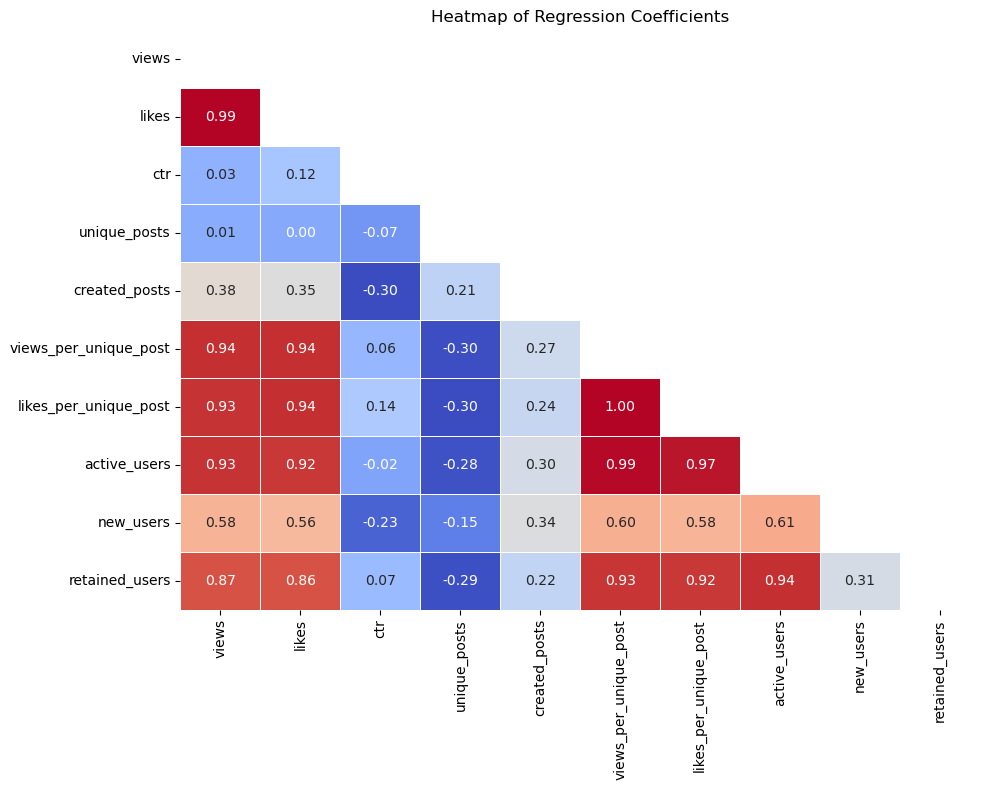

In [17]:
regression_coefficients = activity_metrics_hour.query("hour < '2023-07-14'").drop(['hour'], axis=1).corr()

# Create a heatmap of the regression coefficients
plt.figure(figsize=(10, 8))

# Create a mask to hide the upper triangle elements
mask = np.triu(m=np.ones_like(regression_coefficients, dtype=bool))

sns.heatmap(regression_coefficients, annot=True, cbar=False, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Heatmap of Regression Coefficients')
plt.tight_layout()
plt.show()

and with Spearman?

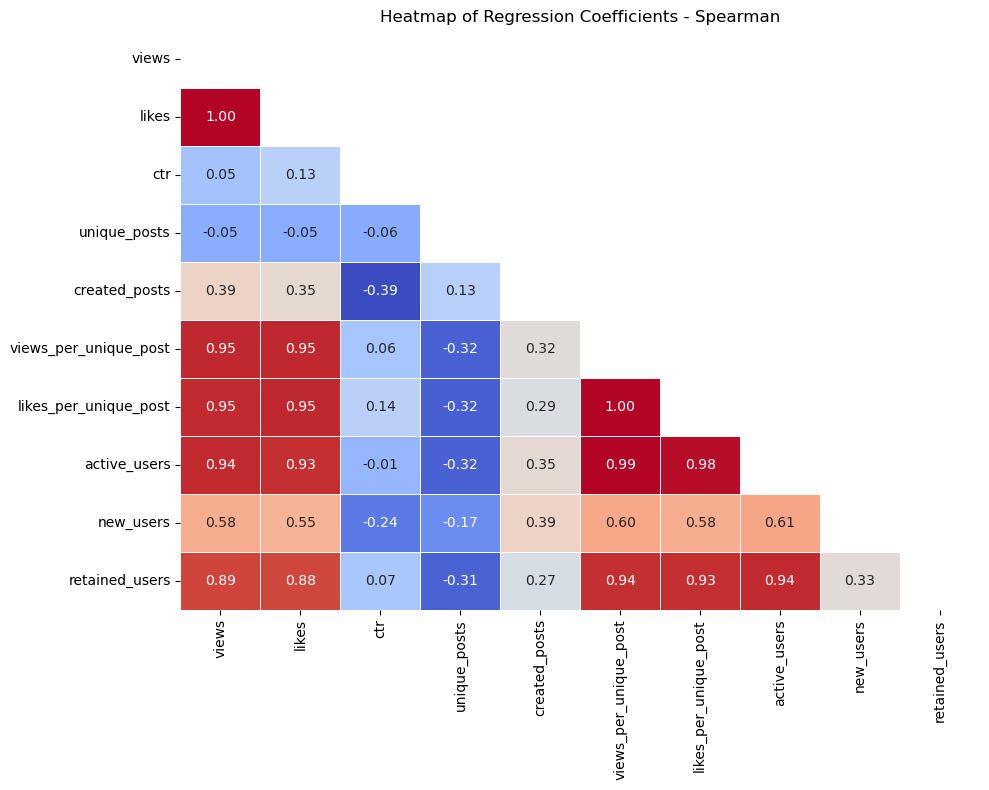

In [18]:
regression_coefficients = activity_metrics_hour.query(
    "hour < '2023-07-14'").drop(['hour'], axis=1).corr(method="spearman")

# Create a heatmap of the regression coefficients
plt.figure(figsize=(10, 8))

# Create a mask to hide the upper triangle elements
mask = np.triu(m=np.ones_like(regression_coefficients, dtype=bool))

sns.heatmap(regression_coefficients, annot=True, cbar=False, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Heatmap of Regression Coefficients - Spearman')
plt.tight_layout()
plt.show()

Finally, look at the scatter matrix

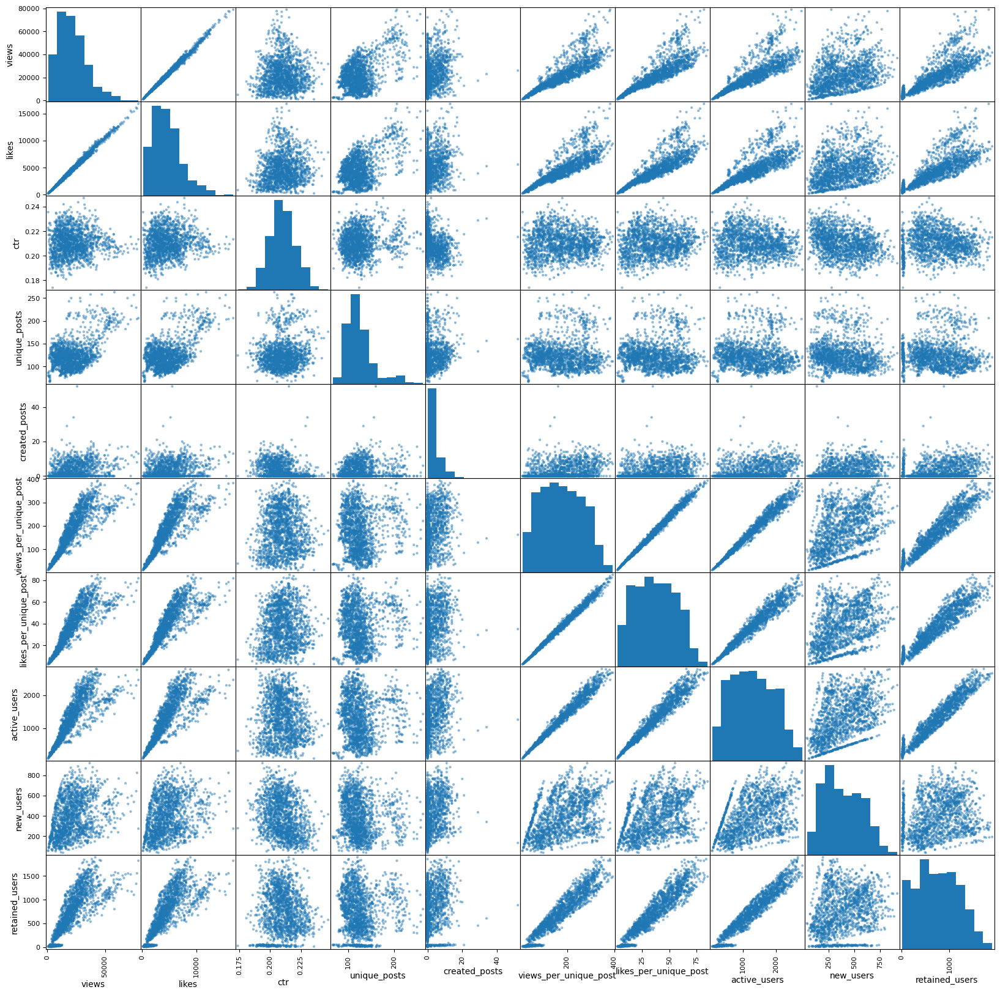

In [19]:
matrix = pd.plotting.scatter_matrix(activity_metrics_hour.iloc[1:], figsize=(20, 20))

Now, take a look at the time series plots, and based on both the plots and the correlation data, let's choose the regressor metrics.

### <a id="visualizing-time-series"></a>1.3. Visualizing time series


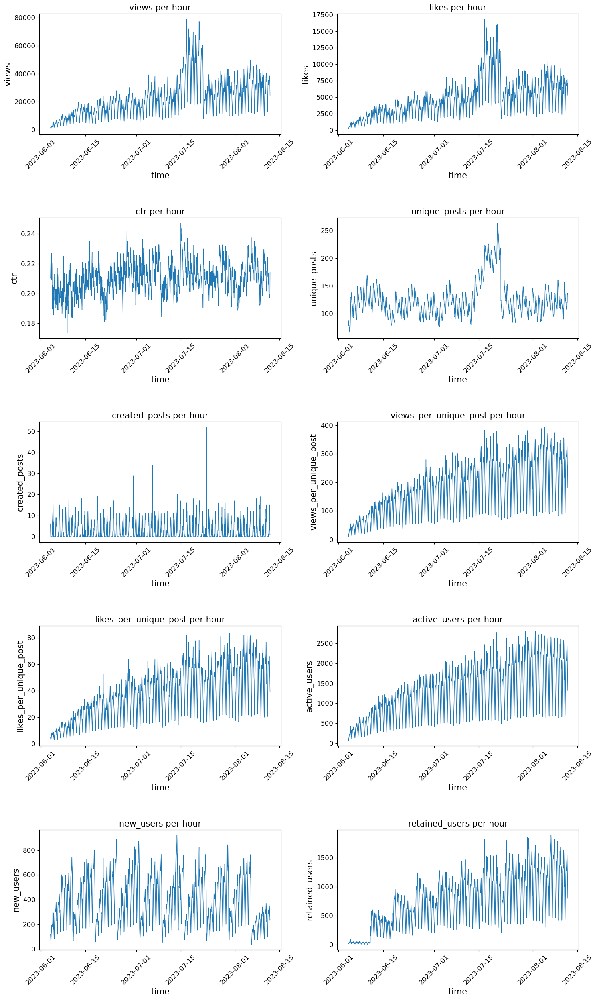

In [20]:
# make a canvas, set sizes
fig, axs = plt.subplots(5, 2, figsize=(15, 25))
for series, ax in zip(list(activity_metrics_hour)[1:], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics_hour,
        x='hour',
        y=series,
        ax=ax,
        title=f'{series} per hour',
        xlabel='time',
        ylabel=f'{series}',
        legend=False
        )

plt.tight_layout(h_pad=5)


Now the same metrics with daily resolution

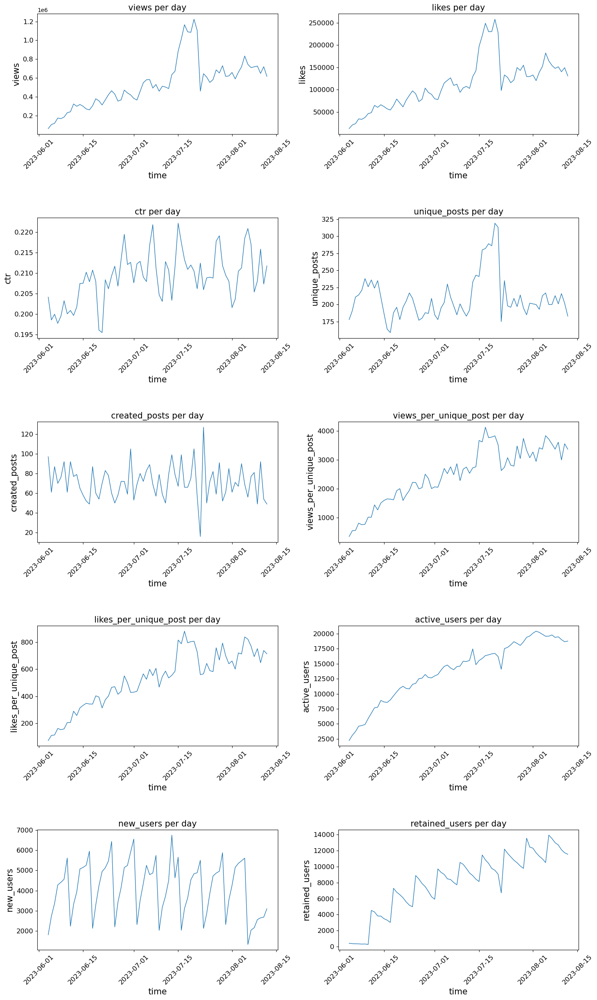

In [21]:
# make a canvas, set sizes
fig, axs = plt.subplots(5, 2, figsize=(15, 25))
for series, ax in zip(list(activity_metrics_day)[1:], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics_day,
        x='day',
        y=series,
        ax=ax,
        title=f'{series} per day',
        xlabel='time',
        ylabel=f'{series}',
        legend=False
        )

plt.tight_layout(h_pad=5)


### <a id="choosing-hourly-active-user"></a>  1.4. Choosing hourly active user as a metric

Among all the metrics, let's first select the metrics for unique users: total count, new, retained:
1. Generally they don't have major jumps in value (except for the drop on July 21-22), which is a good indicator of their stability.  
Contrary to this, views and likes were heavily impacted by a campaign at the end of July.  
Even though this was a short-term effect, it doesn't represent the metric's general trend and can negatively impact forecasting.

2. They are growing over time with a more or less noticeable trend, unlike the CTR (which might have minor growth) and unique and created posts (which seem not to grow).
3. Lastly, they indeed represent user activity, which can be interpreted as server load.  
While views and likes per unique post follow similar trends, they rather indicate the "quality" of posts and not the feed load (e.g., we can have the same number of users but different browsing and liking speed).


Let's examine these three metrics with the hour resolution and decompose the respective time series

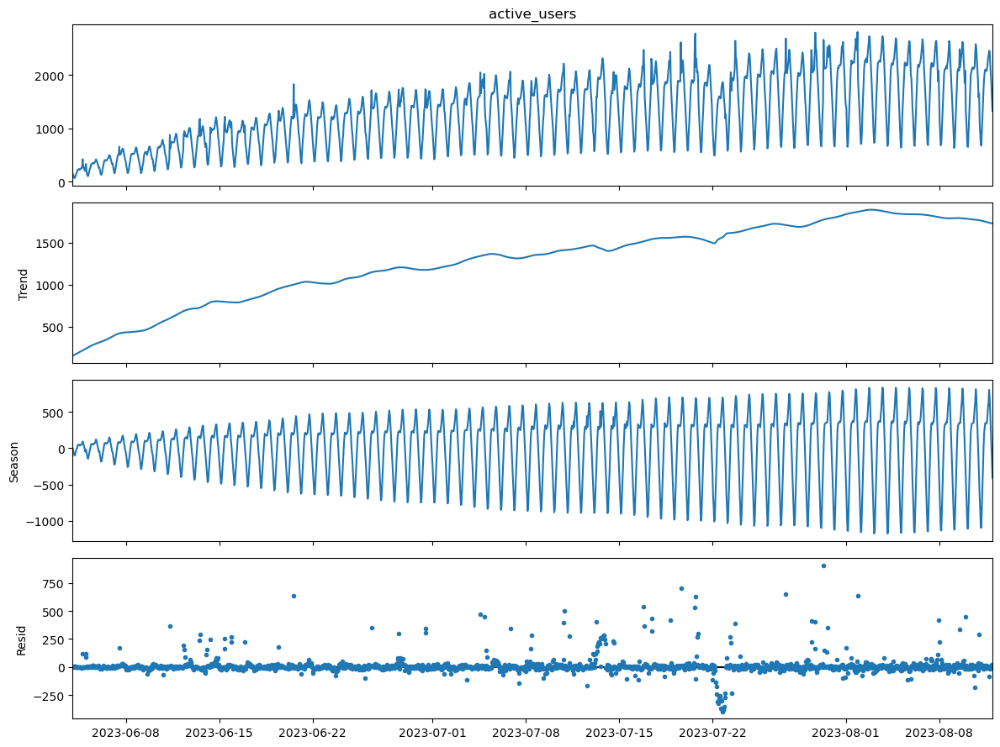

In [22]:
# Decompose the 'active_users' metric using STL
res = STL(activity_metrics_hour.set_index('hour')['active_users'], robust=True).fit()

# Plot the decomposition results using the previously defined function
decompose_plotter(res)

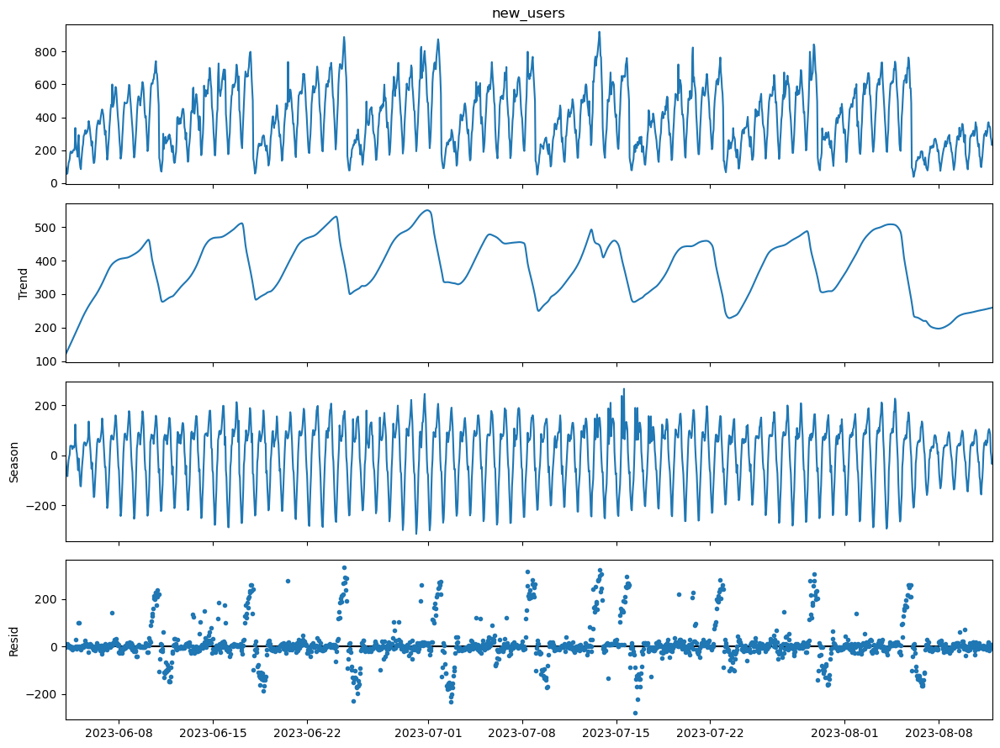

In [23]:
# Decompose the 'new_users' metric using STL
res = STL(activity_metrics_hour.set_index('hour')['new_users'], robust=True).fit()

# Plot the decomposition results using the previously defined function
decompose_plotter(res)

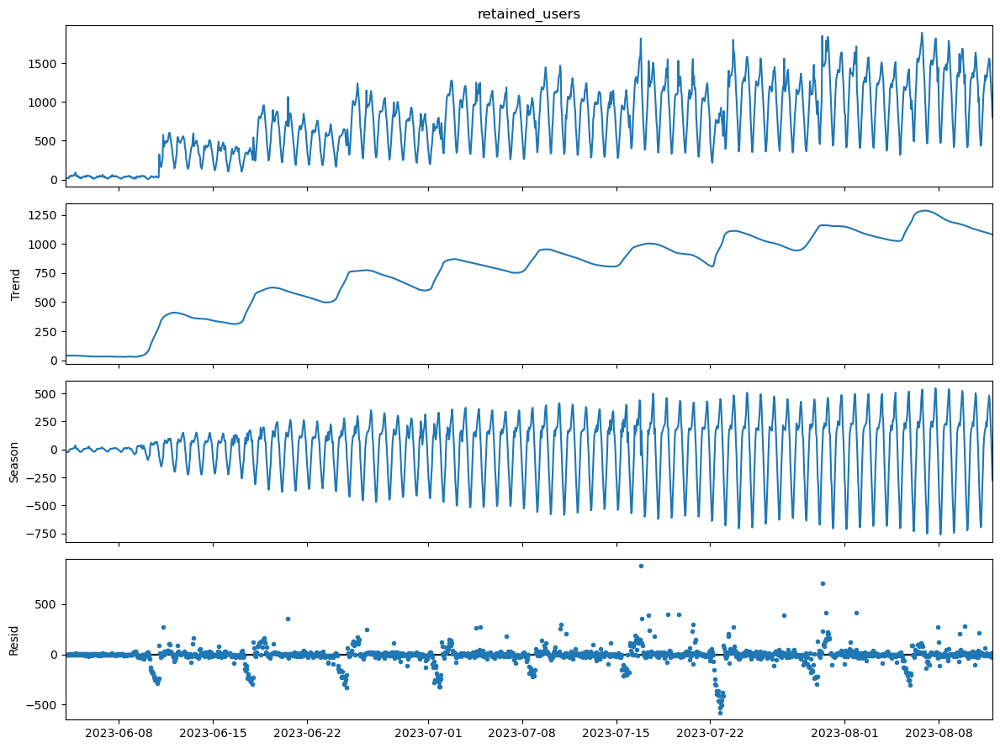

In [24]:
# Decompose the 'retained_users' metric using STL
res = STL(activity_metrics_hour.set_index('hour')['retained_users'], robust=True).fit()

# Plot the decomposition results using the previously defined function
decompose_plotter(res)

- Which of the three to choose: total, new, or retained active users?  

- The total count includes information from both groups: new and retained. Typically, the first group is the source of our future retained users, while retained users usually exhibit higher quality.  
- So, we will opt for the total number of active users.  
- Regarding the time resolution, let's look at both hourly and daily resolution: since we have peaks of activity and inactivity defined with an hourly resolution, this might be important for future forecasting to not only evaluate averages but also peak workloads. Daily metrics are less noisy and may have different forecasting behavior, which can be beneficial for us.


### 1.5. <a id="choosing-regressors"></a>Choosing regressors

What regressors, if any, do we choose?

Possible options:
- Binary regressors (sequences of 0s and 1s):
    - Anomaly days: campaigns, tests, app failures, etc.

- Metrics:
    - Views per unique post - this is the highest correlating value. To forecast this metric, we'll use a regressor considering the campaign as a regressor - July 13-21 (increase in views)

The drop on July 22 will be "smoothed out" by averaging the two neighboring days.

When exactly did we have this drop?

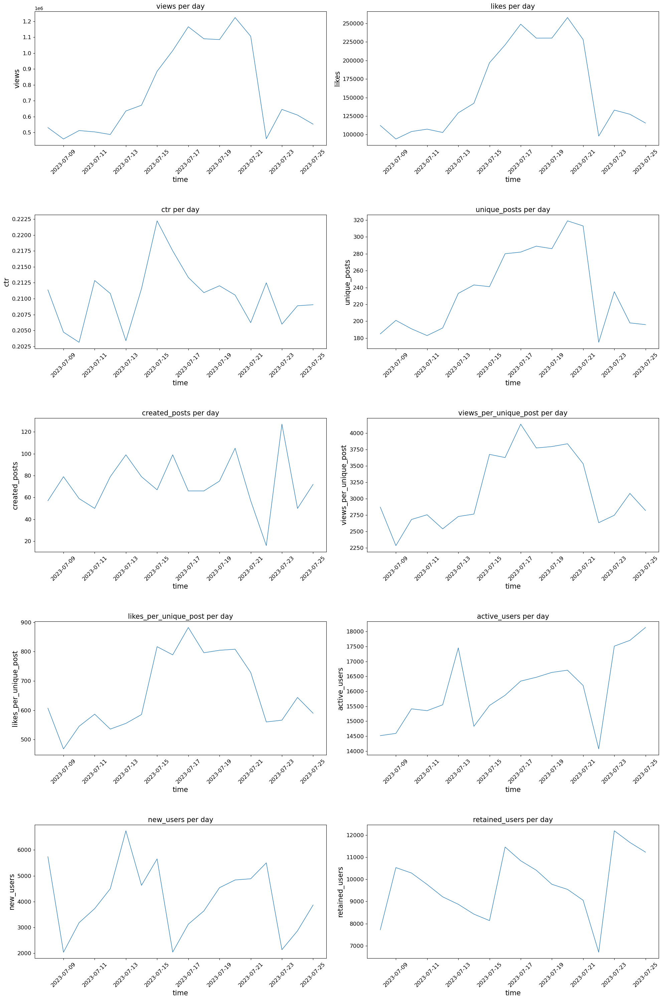

In [25]:
# make a canvas, set sizes
fig, axs = plt.subplots(5, 2, figsize=(20, 30))
for series, ax in zip(list(activity_metrics_day)[1:], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics_day.loc[activity_metrics_day.day.between('2023-07-08', '2023-07-25')],
        x='day',
        y=series,
        ax=ax,
        title=f'{series} per day',
        xlabel='time',
        ylabel=f'{series}',
        legend=False
        )

plt.tight_layout(h_pad=5)


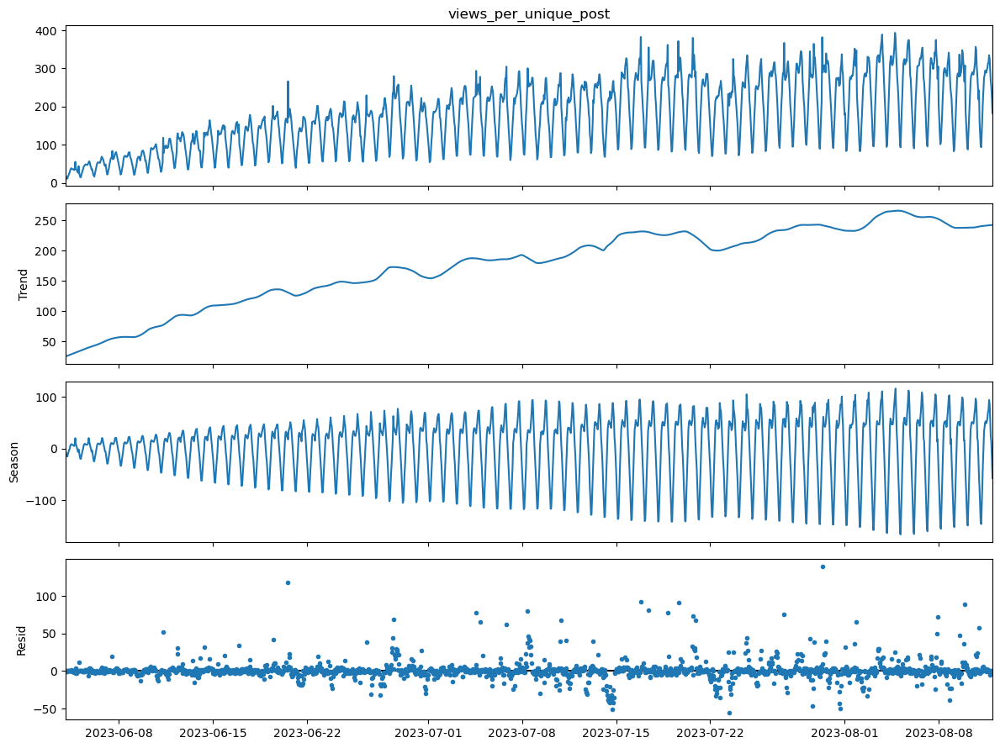

In [26]:
# Decompose the 'views_per_unique_post' metric using STL
res = STL(activity_metrics_hour.set_index('hour')['views_per_unique_post'], robust=True).fit()

# Plot the decomposition results using the previously defined function
decompose_plotter(res)

Given that our data also seems to have a weekly seasonality, let's also decompose it based on daily views.


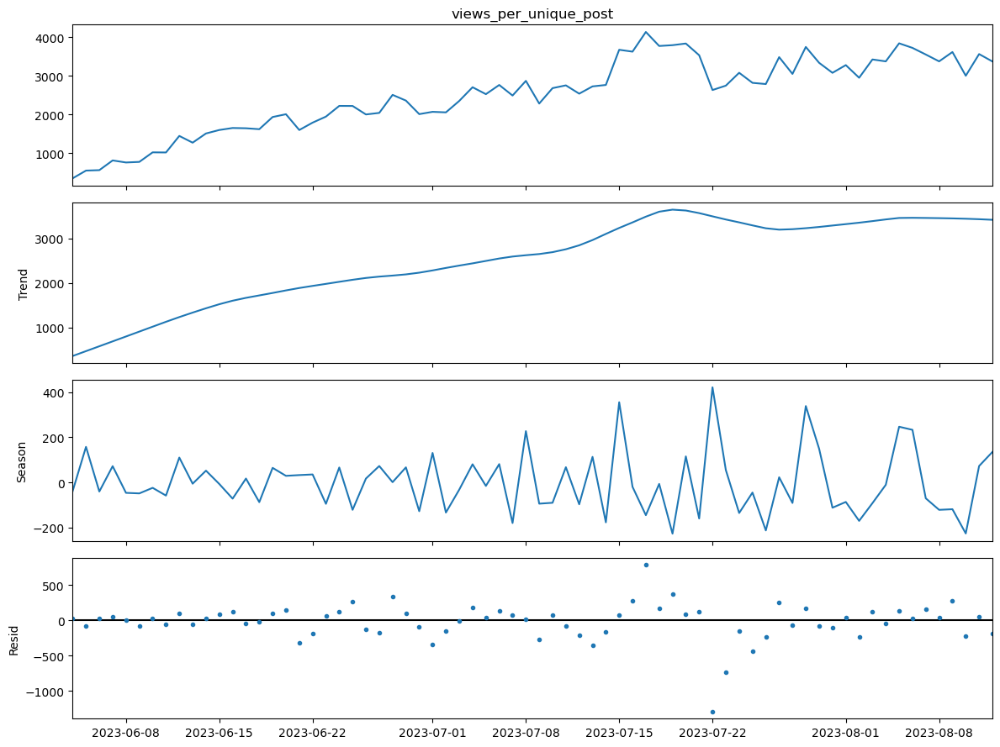

In [28]:
# Decompose the 'views_per_unique_post' metric using STL
res = STL(activity_metrics_day.set_index('day')['views_per_unique_post'], robust=True).fit()

# Plot the decomposition results using the previously defined function
decompose_plotter(res)

It seems that the drop occurred specifically on July 22nd, throughout the entire day, and did not affect the neighboring days


## <a id="forecasting-the-regressor-metric"></a>2. Forecasting the regressor metric
---
Now we will forecast the metric - views per unique post using/without using a binary regressor and validate the model.  
In the end, we should have two forecasts: a pessimistic one (underestimating views) and an optimistic one (overestimating views).

First, drop the columns we don't need in our dataframe

In [28]:
to_drop = [
         'views',
         'likes',
         'ctr',
         'unique_posts',
         'created_posts',
         'likes_per_unique_post',
        'new_users',
        'retained_users'
]

activity_metrics_hour.drop(to_drop, axis=1, inplace=True)

### 2.1.1 Creating sub-regressors<a id="2.1.1-creating-sub-regressors"></a>


Let's make column for a sub-regressor: campaign-caused jump on 14-21 july.

In [29]:
start_date_jump = pd.Timestamp('2023-07-13')
end_date_jump = pd.Timestamp('2023-07-21')

# Add 'jump_campaign' column
activity_metrics_hour['jump_campaign'] = (
    (activity_metrics_hour['hour'] >= start_date_jump) & 
    (activity_metrics_hour['hour'] <= end_date_jump)
).astype(int)

# same for daily metric
activity_metrics_day['jump_campaign'] = (
    (activity_metrics_day['day'] >= start_date_jump) & 
    (activity_metrics_day['day'] <= end_date_jump)
).astype(int)

### 2.1.2 Creating transformed metrics<a id="2.1.2-creating-transformed-metrics"></a>


For views and active users, make z-scored and log derivatives as well as box-cox transformed one

In [30]:
metrics = [
    'views_per_unique_post',
    'active_users'
]

dataframes = [
    activity_metrics_hour,
    activity_metrics_day
]

time_columns = [
    'hour',
    'day'
]

for metric in metrics:
    for df, time_column in zip(dataframes, time_columns):
        # Calculate mean and standard deviation
        mean = df[metric].mean()
        std = df[metric].std()
        
        # make a column with z-scores
        df['z_scored_' + metric] = df[metric].sub(mean).div(std)
        
        # make a log column
        df['log_' + metric] = np.log(df[metric])
        
        # make a column with box-cox transformation
        transformed_data, lambda_value = boxcox(df[metric])
        df['boxcox_' + metric] = transformed_data
        df['boxcox_lambda_for_' + metric] = lambda_value       
        
        # make a column with smoothened 22 july values
        smooth_value_at_date(df=df,
                     time_column=time_column, 
                     value_column='log_'+metric, 
                     date_to_smooth='2023-07-22'
                    )
        
        smooth_value_at_date(df=df,
                     time_column=time_column, 
                     value_column='z_scored_'+metric, 
                     date_to_smooth='2023-07-22'
                    )
        

In [31]:
activity_metrics_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1657 entries, 0 to 1656
Data columns (total 16 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   hour                                     1657 non-null   datetime64[ns]
 1   views_per_unique_post                    1657 non-null   float64       
 2   active_users                             1657 non-null   uint64        
 3   jump_campaign                            1657 non-null   int64         
 4   z_scored_views_per_unique_post           1657 non-null   float64       
 5   log_views_per_unique_post                1657 non-null   float64       
 6   boxcox_views_per_unique_post             1657 non-null   float64       
 7   boxcox_lambda_for_views_per_unique_post  1657 non-null   float64       
 8   smooth_log_views_per_unique_post         1657 non-null   float64       
 9   smooth_z_scored_views_per_unique_post    

How does log metric behave in time? how does it correlate with active_users target metric?

In [32]:
activity_metrics_hour.query("hour < '2023-07-14'")[[
    'log_views_per_unique_post', \
    'views_per_unique_post', 
    'active_users', 
    'log_active_users',
    'boxcox_views_per_unique_post']].corr()

,log_views_per_unique_post,views_per_unique_post,active_users,log_active_users,boxcox_views_per_unique_post
log_views_per_unique_post,1.000,0.947,0.942,0.994,0.973
views_per_unique_post,0.947,1.000,0.988,0.937,0.995
active_users,0.942,0.988,1.000,0.947,0.985
log_active_users,0.994,0.937,0.947,1.000,0.964
boxcox_views_per_unique_post,0.973,0.995,0.985,0.964,1.000


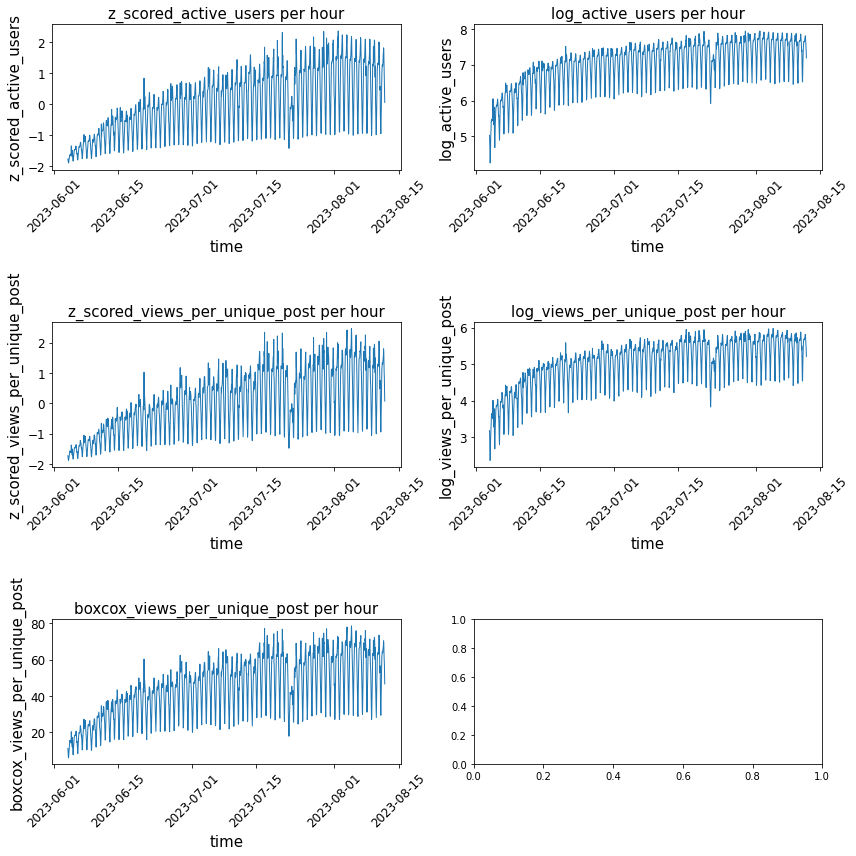

In [33]:
# make a canvas, set sizes
fig, axs = plt.subplots(3, 2, figsize=(12, 12))
for series, ax in zip(['z_scored_active_users',
                       'log_active_users',
                       'z_scored_views_per_unique_post', 
                       'log_views_per_unique_post',
                       'boxcox_views_per_unique_post'
                      ], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics_hour,
        x='hour',
        y=series,
        ax=ax,
        title=f'{series} per hour',
        xlabel='time',
        ylabel=f'{series}',
        legend=False
        )

plt.tight_layout(h_pad=5)


- Boxcox doesn't show much difference compared to the original views - it's also non-stationary with increasing variance.  

- However, taking log of the views, on the contrary, helps to reduce amplitude while still preserving the original trend.  
- Let's focus on the z-scored views (this transformation can sometimes aid in forecasting) and on the logarithm. We'll try adding a smoothing effect by replacing the outlier values of July 22nd with the average values of July 21st and 23rd.  
- We will not consider the views without any transformation and will only consider the smoothed metrics.  

Let's start with the DLT model.


### 2.1.3 Splitting the dataset<a id="2.1.3-splitting-the-dataset"></a>

Let's have the last 14 days of the time-series as a testing part. Later on, we will try to increase forecasting window.

In [34]:
# first, separate our df into train and split parts
n_days = 14
test_size=24 * n_days

train_df=activity_metrics_hour[:-test_size]
test_df=activity_metrics_hour[-test_size:]

### 2.1.4 Setting arguments for a model<a id="2.1.4-setting-arguments-for-a-model"></a>


Let's set parameters for models with hourly metrics

In [35]:
date_col = 'hour'
seasonality = 24
regressor_col = ['jump_campaign']

### 2.2. views - no regressors - DLT<a id="2.2-views-no-regressors-dlt"></a>


In [36]:
# set our arguments for the model and a plot
response_col = 'smooth_z_scored_views_per_unique_post'

In [37]:
# initialize a model
z_views_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

# train and make a prediction
z_views_dlt.fit(train_df)
predicted_df = z_views_dlt.predict(df=activity_metrics_hour, decompose=True)

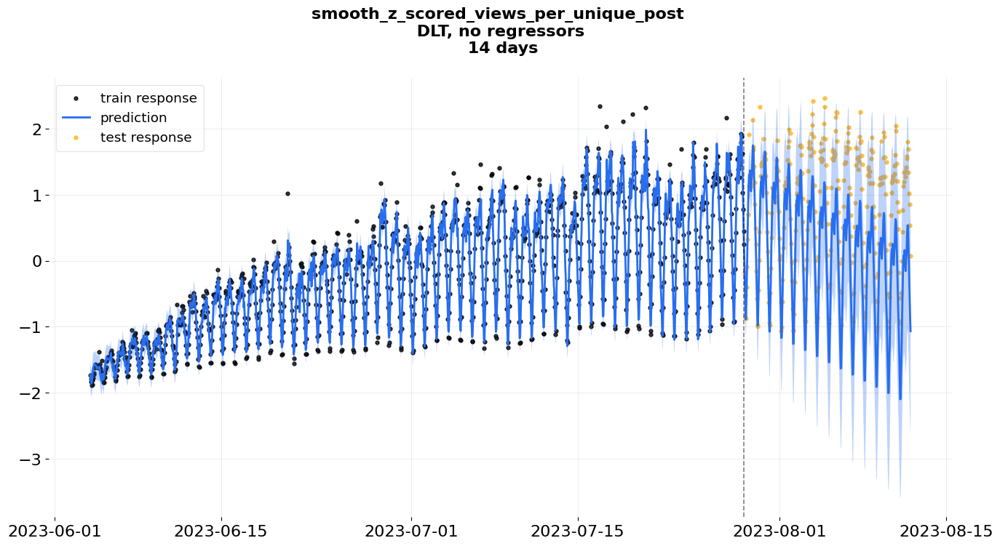

In [38]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

The trend is quite negative. What about log metric?

### 2.3. log(views) - no regressors - DLT<a id="2.3-log-views-no-regressors-dlt"></a>


In [39]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [40]:
# initialize a model
log_views_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

# train and make a prediction
log_views_dlt.fit(train_df)
predicted_df = log_views_dlt.predict(df=activity_metrics_hour, decompose=True)

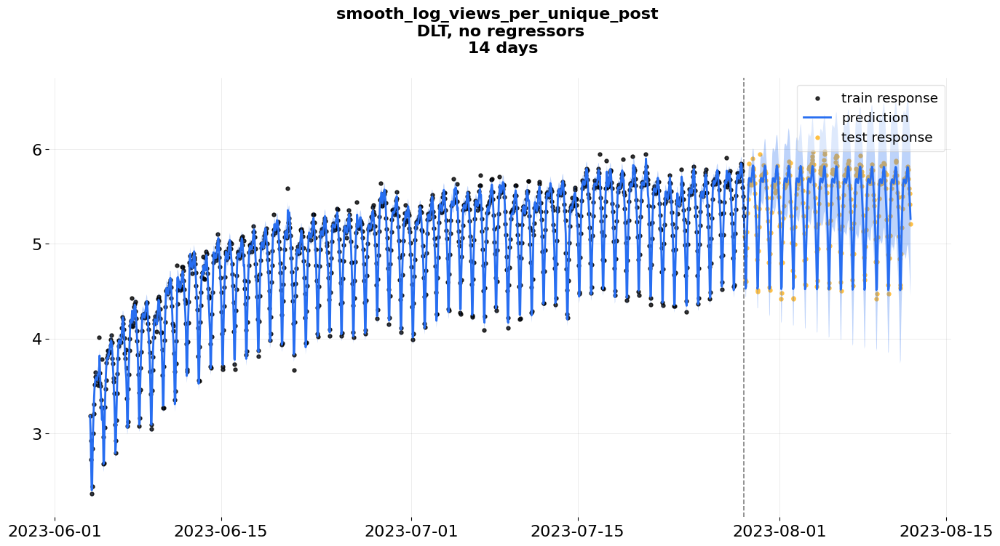

In [41]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

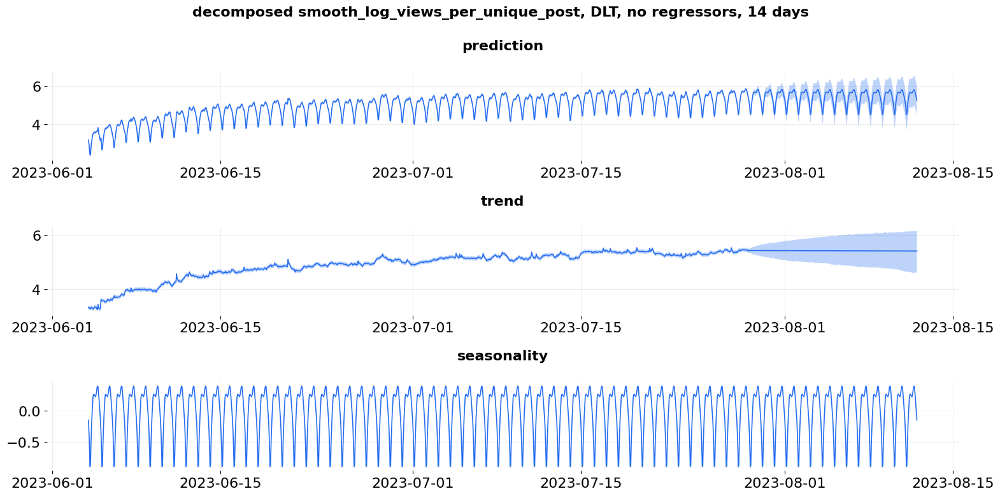

In [42]:
plot_predicted_components(
    predicted_df, 
    date_col,
    plot_components=[
        'prediction', 
        'trend', 
        'seasonality'
    ],
    title=f'decomposed {response_col}, DLT, no regressors, {n_days} days'
);

- It looks more reasonable now, but the confidence interval bounds are quite wide and steep! The forecast systematically underestimates the data.  

- Despite it performing better, our trend is missing the weekly seasonality and goes constantly without fluctuations.  

Let's try adding binary regressors to the logarithmic metric.


### 2.4. log(views) - with regressor - DLT<a id="2.4-log-views-with-regressor-dlt"></a>


In [43]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [44]:
# initialize a model
log_views_reg_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
          regressor_col=regressor_col,
               )

# train and make a prediction
log_views_reg_dlt.fit(train_df)
predicted_df = log_views_reg_dlt.predict(df=activity_metrics_hour, decompose=True)

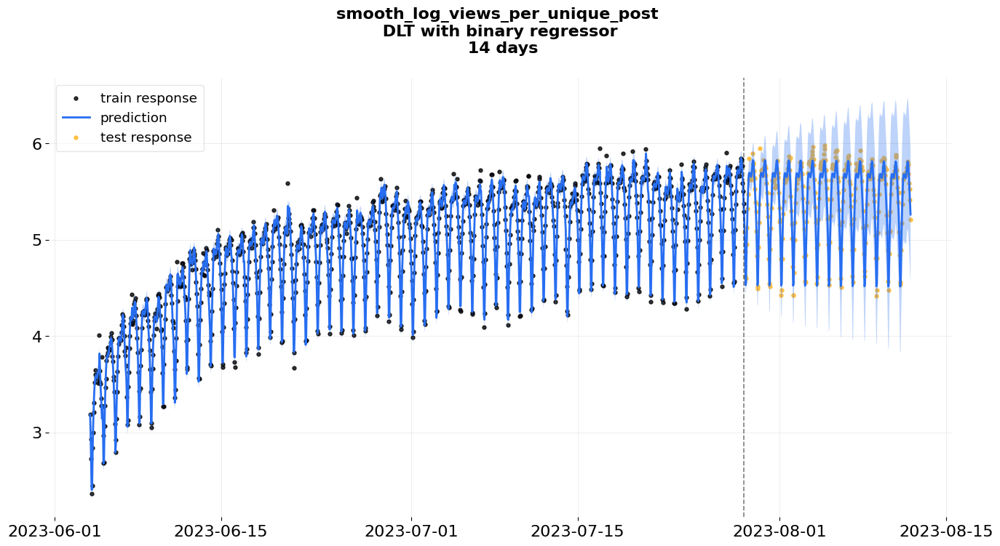

In [45]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT with binary regressor \n {n_days} days',
                       );

The difference isn't that significant.

- It's interesting that even though we provided a regressor for the increased views during the campaign period, the model still underestimated the metric throughout this duration.

- While logarithmic transformation performs better than standardized views (too many dips), it doesn't retain the multiple seasonality.


### 2.5. daily views - with regressor - DLT<a id="2.5-daily-views-with-regressor-dlt"></a>


- Regardless of what we've done so far, the trend for views seems too low.   

- It appears (especially based on the forecast using the logarithmic metric and the decomposition of views) that our data has both daily and weekly seasonality, and we are currently at a weekly low.  
- However, the model doesn't recognize this and predicts that the trend will continue to decline.   

To be sure, let's examine the daily views with regressors and weekly seasonality - how will they behave?


In [46]:
# set our arguments for the model and a plot
response_col = 'smooth_z_scored_views_per_unique_post'

In [47]:
# initialize a model
daily_z_views_reg_dlt = DLT(
          response_col=response_col,
          date_col='day',
          seasonality=7,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
          regressor_col=regressor_col,
               )

# train and make a prediction
daily_z_views_reg_dlt.fit(activity_metrics_day[:-14])
predicted_df = daily_z_views_reg_dlt.predict(df=activity_metrics_day, decompose=True)

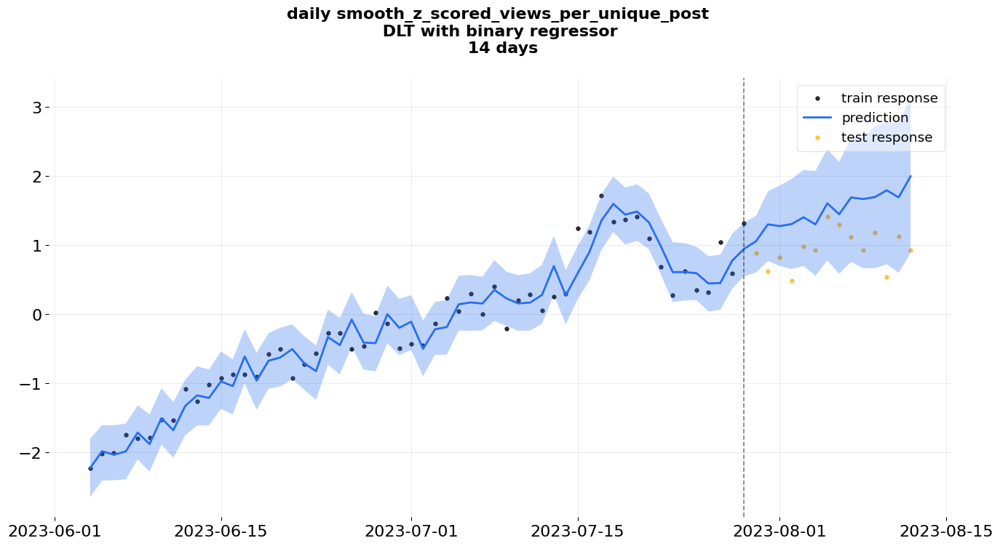

In [48]:
plot_predicted_data(training_actual_df=activity_metrics_day[:-14],
                        predicted_df=predicted_df,
                        date_col='day', 
                        actual_col=response_col,
                        test_actual_df=activity_metrics_day[-14:], 
                        lw=2,
                    title=f'daily {response_col} \n DLT with binary regressor \n {n_days} days',
                       );

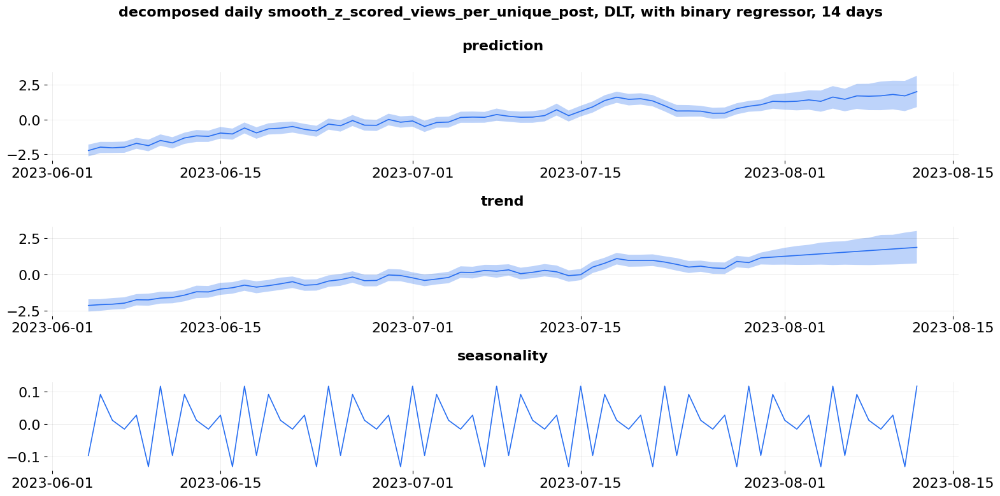

In [49]:
plot_predicted_components(
    predicted_df, 
    'day',
    plot_components=[
        'prediction', 
        'trend', 
        'seasonality'
    ],
    title=f'decomposed daily {response_col}, DLT, with binary regressor, {n_days} days'
);

- This option looks better than the hourly linear views, trying to add weekly seasonality. 

- However, it overestimates the data.

Finally, try the KTR model for the metric +- regressors.

### 2.6. log(views) - no regressors - KTR<a id="2.6-log-views-no-regressors-ktr"></a>


In [50]:
# set new arguments for a model to account for 
# multiple seasonality
date_col = 'hour'
seasonality = [24, 168]
regressor_col = ['jump_campaign']

In [51]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [52]:
# initialize a model
smooth_log_views_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=seasonality,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

# train and make a prediction
smooth_log_views_ktr.fit(train_df)
predicted_df = smooth_log_views_ktr.predict(df=activity_metrics_hour, decompose=True)

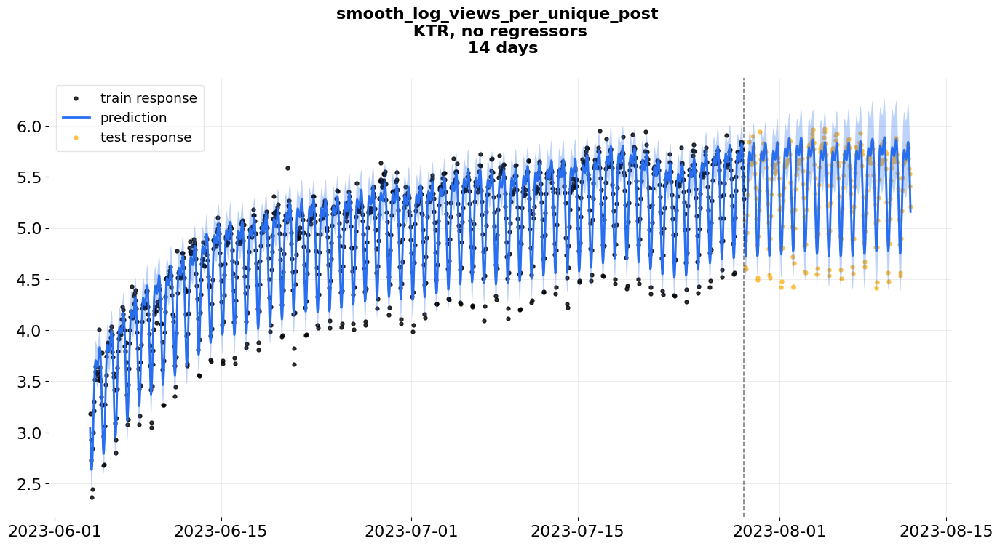

In [53]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n KTR, no regressors \n {n_days} days',
                       );

### 2.7. log(views) - with regressor - KTR<a id="2.7-log-views-with-regressor-ktr"></a>


In [54]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [55]:
# initialize a model
log_views_reg_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=seasonality,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
    regressor_col=regressor_col,
)

# train and make a prediction
log_views_reg_ktr.fit(train_df)
predicted_df = log_views_reg_ktr.predict(df=activity_metrics_hour, decompose=True)

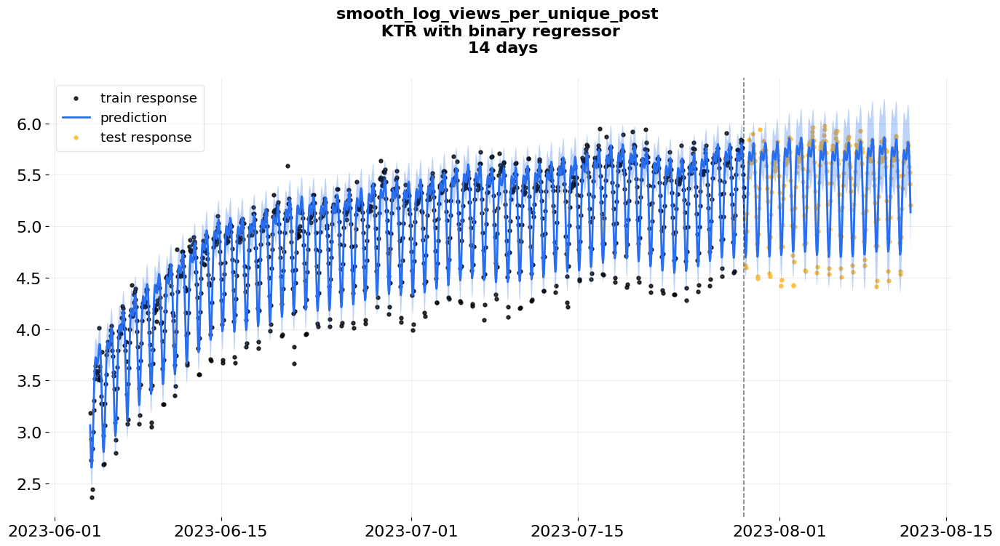

In [56]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n KTR with binary regressor \n {n_days} days',
                       );

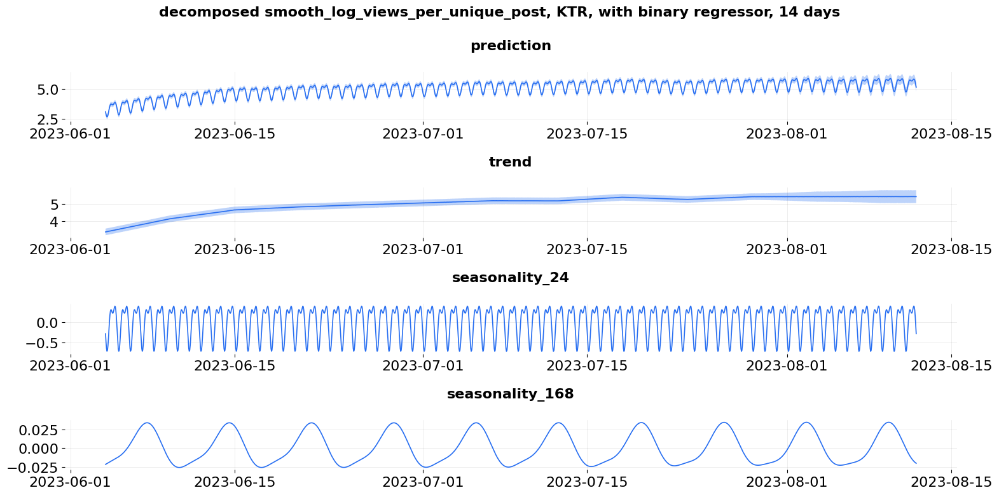

In [57]:
plot_predicted_components(
    predicted_df, 
    date_col,
    plot_components=[
        'prediction', 
        'trend', 
        'seasonality_24',
        'seasonality_168'
    ],
    title=f'decomposed {response_col}, KTR, with binary regressor, {n_days} days'
);

Very similar. What about daily views?

### 2.8. daily views - with regressor - KTR<a id="2.8-daily-views-with-regressor-ktr"></a>


In [58]:
# set our arguments for the model and a plot
response_col = 'smooth_z_scored_views_per_unique_post'

In [59]:
# initialize a model
daily_z_views_reg_ktr = KTR(
    response_col=response_col,
    date_col='day',
    seasonality=7,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
    regressor_col=regressor_col,
)

# train and make a prediction
daily_z_views_reg_ktr.fit(activity_metrics_day[:-14])
predicted_df = daily_z_views_reg_ktr.predict(df=activity_metrics_day, decompose=True)

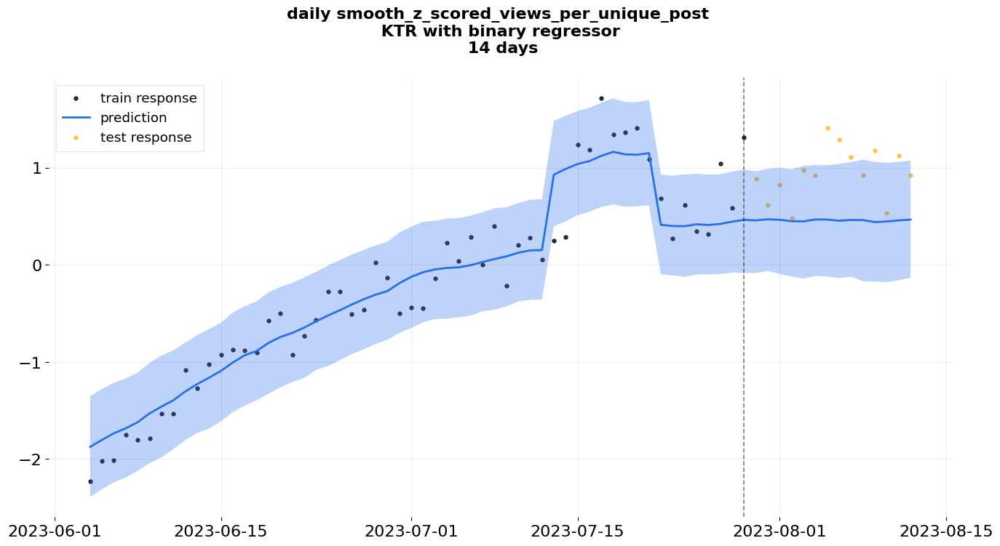

In [60]:
plot_predicted_data(training_actual_df=activity_metrics_day[:-14],
                        predicted_df=predicted_df,
                        date_col='day', 
                        actual_col=response_col,
                        test_actual_df=activity_metrics_day[-14:], 
                        lw=2,
                    title=f'daily {response_col} \n KTR with binary regressor \n {n_days} days',
                       );

This gives us a more pessimistic forecast with an underestimation of the data. Moreover, for some reasons, it doesn't take into account the weekly seasonality.

### 2.9. Summary<a id="2.9-summary"></a>

- For the z-scored metrics in DLT, the trend does not match reality and underestimates the data;

- For the logarithmic metric in DLT, the trend looks better, but the confidence interval boundaries become too wide over time. In the KTR model, the forecast is narrow, but its confidence interval encompasses observations;
- The KTR model for logarithmic views tends to overestimate the training data overall;
- The presence of a regressor does not greatly change the forecast for the logarithmic metric in both DLT and KTR;
- Daily z-scored views in DLT look accurate (a bit optimistic), but the KTR model's forecast underestimates the data.

Let's consider several combinations, compare them using backtesting, and choose the one with the smallest error:
 - logarithmic views, without regressors, in the KTR model;
 
 - logarithmic views, without regressors, in the DLT model;
 - daily z-scored views with regressors in the DLT model.


## 3. Optimizing the regressor forecast <a id="3-optimizing-the-regressor-forecast"></a>


Now we need to make a decision:
1. which regressor we will choose

2. what parameters we will focus on (the decay coefficient for DLT and the forecast length).


### 3.1. Backtest of log views, no regressors, DLT <a id="3.1-backtest-of-log-views-no-regressors-dlt"></a>


Forecast for 14 days and review each split iteration - trend and the smape metric.
We will use an expanding window since the metric seems not very volatile.

In [61]:
response_col = 'smooth_log_views_per_unique_post'
date_col = 'hour'
seasonality = 24
regressor_col = ['jump_campaign']

In [62]:
# initialize a model
model = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

In [63]:
forecast_len = 14

# create a backtester object
bt_obj = BackTester(
    model=model, # model used
    df=activity_metrics_hour, # dataframe for training
    min_train_len=24*7, # shortest interval to start training
    incremental_len=24*7, # training interval increment
    forecast_len=24*forecast_len, # forecast length
    window_type="expanding"
)

In [64]:
bt_obj.fit_predict() # training

In [65]:
bt_obj.score() # show the metrics

,metric_name,metric_values,is_training_metric
0,smape,0.025,False
1,wmape,0.025,False
2,mape,0.025,False
3,mse,0.028,False
4,mae,0.129,False
5,rmsse,1.012,False


In [66]:
predicted_df = bt_obj.get_predicted_df()

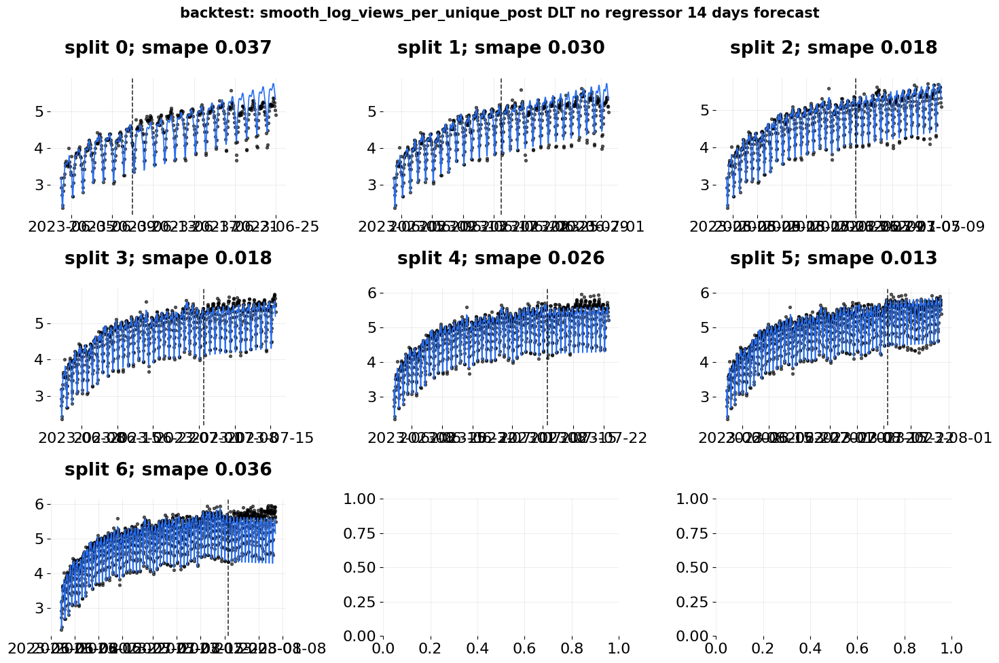

In [67]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: {response_col} DLT no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

We observe two drops: on split 4 and split 6 - such behavior (the trend just going down) can be indicative of a systematic underestimation of our forecast if we opt for it.


### 3.2. Backtest of log views, no regressors, KTR <a id="3.2-backtest-of-log-views-no-regressors-ktr"></a>


In [68]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [69]:
# initialize a model
model = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=[24, 168],
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

In [70]:
forecast_len = 14

# create a backtester object, same argument types as before
bt_obj = BackTester(
    model=model, #
    df=activity_metrics_hour,
    min_train_len=24*7, 
    incremental_len=24*7, 
    forecast_len=24*forecast_len,
    window_type="expanding" 
)

In [71]:
bt_obj.fit_predict() # train

In [72]:
bt_obj.score() # metrics

,metric_name,metric_values,is_training_metric
0,smape,0.056,False
1,wmape,0.051,False
2,mape,0.053,False
3,mse,0.140,False
4,mae,0.260,False
5,rmsse,2.274,False


In [73]:
predicted_df = bt_obj.get_predicted_df()

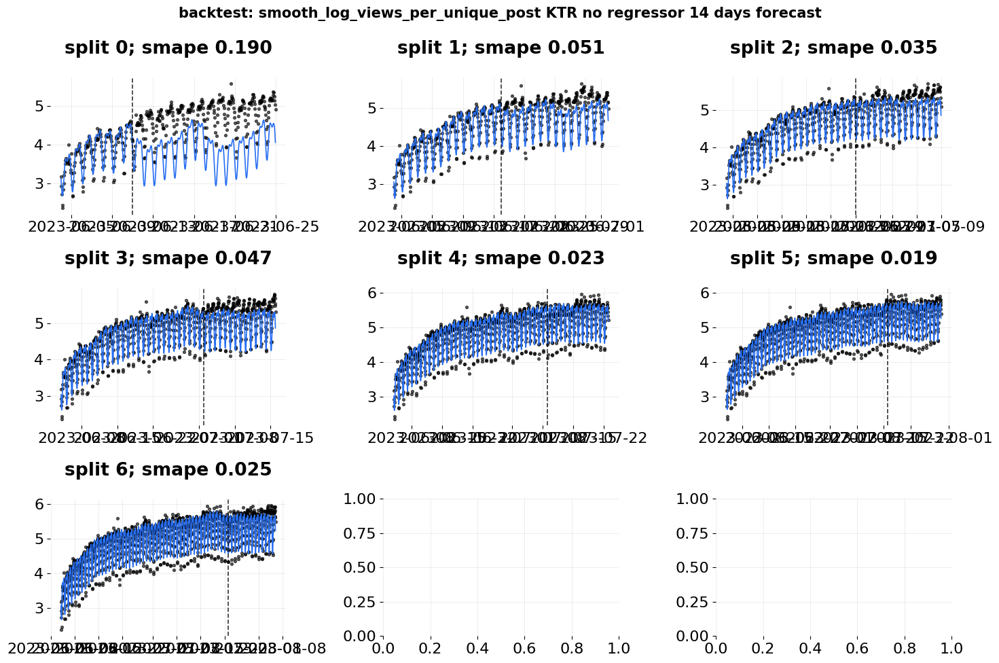

In [74]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: {response_col} KTR no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

Here, there are also drops - splits 3 and 6. However, the trend here does not go down too sharply.


### 3.3. Backtest of daily views, no regressors, DLT <a id="3.3-backtest-of-daily-views-no-regressors-dlt"></a>


In [75]:
response_col = 'smooth_z_scored_views_per_unique_post'
date_col = 'day'
seasonality = 7
regressor_col = ['jump_campaign']

In [76]:
# initialize a model
model = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

In [77]:
forecast_len = 14

# create a backtester object
bt_obj = BackTester(
    model=model, 
    df=activity_metrics_day, 
    min_train_len=7, 
    incremental_len=7, 
    forecast_len=forecast_len, 
    window_type="expanding" 
)

In [78]:
bt_obj.fit_predict() # train

In [79]:
bt_obj.score() # metrics

,metric_name,metric_values,is_training_metric
0,smape,0.916,False
1,wmape,1.017,False
2,mape,5.112,False
3,mse,0.784,False
4,mae,0.683,False
5,rmsse,2.209,False


In [80]:
predicted_df = bt_obj.get_predicted_df()

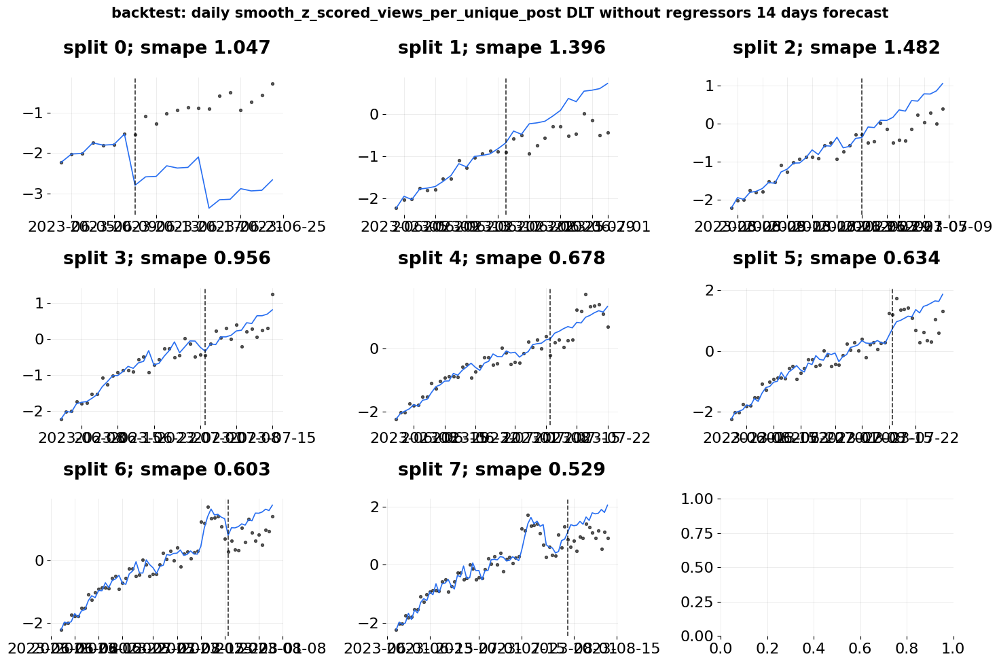

In [81]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: daily {response_col} DLT without regressors {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

Again, as before, we observe an overestimation here.  
Now, iterations with regressors.


### 3.4. Backtest of views with regressor, DLT <a id="3.4-backtest-of-views-with-regressor-dlt"></a>


In [82]:
# initialize a model
model = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
          regressor_col=regressor_col,
               )

In [83]:
forecast_len = 14

# create a backtester object
bt_obj = BackTester(
    model=model, 
    df=activity_metrics_day, 
    min_train_len=7, 
    incremental_len=7, 
    forecast_len=forecast_len,
    window_type="expanding" 
)

In [84]:
bt_obj.fit_predict() # train

In [85]:
bt_obj.score() # metrics

,metric_name,metric_values,is_training_metric
0,smape,0.909,False
1,wmape,1.056,False
2,mape,5.153,False
3,mse,0.995,False
4,mae,0.709,False
5,rmsse,2.488,False


In [86]:
predicted_df = bt_obj.get_predicted_df()

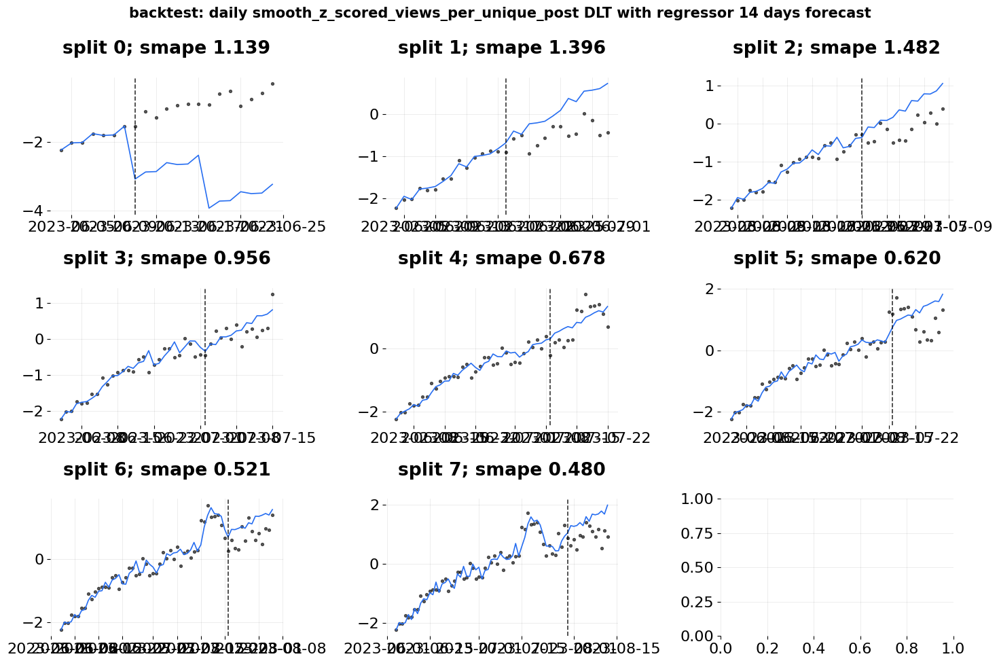

In [87]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: daily {response_col} DLT with regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

It seems that this performs better, but there is still an overestimation.

### 3.5. Choosing metric type and the model for the regressor <a id="3.5-choosing-metric-type-and-the-model-for-the-regressor"></a>


- Let's discard the standardized daily views with the DLT model - it overestimates the data and in the actual forecast doesn't account for any seasonality, just gives a straight line as a trend (not shown in this notebook);

- Let's discard the logarithmic views with the DLT model - it provides too pessimistic forecasts without stability;
- Let's keep the logarithmic views with the KTR model - it's less sensitive to declines, keeps the trend more stable, and even provides some multiple seasonality. Moreover, the bounds of its confidence intervals can be our "pessimistic" and "optimistic" forecasts.


Now let's see how far into the future we can optimally forecast with this model. We will iterate over different values of `forecast_len` and look for optimal combinations of `forecast_len` and `smape`.

In [88]:
# set the columns and seasonality for the model to use
response_col = 'smooth_log_views_per_unique_post'
date_col = 'hour'
seasonality = [24, 168]

In [89]:
# set the forecast length
forecast_lens = np.arange(5, 35, 5)

# titles of the scores to look at
evaluation_scores = pd.DataFrame({'metric_name': ['smape', 'wmape', 'mape', 'mse', 'mae', 'rmsse']})

In [90]:
model = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=seasonality,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

for forecast_len in forecast_lens:
    
    bt_obj = BackTester(
        model=model, 
        df=activity_metrics_hour, 
        min_train_len=24*7, 
        incremental_len=24*7, 
        forecast_len=24*forecast_len,
        window_type="expanding" 
    )

    bt_obj.fit_predict() # train

    evaluation_scores[f'{forecast_len}_days'] = bt_obj.score().metric_values
    

In [91]:
evaluation_scores = evaluation_scores.set_index('metric_name').T.reset_index()
evaluation_scores

metric_name,index,smape,wmape,mape,mse,mae,rmsse
0,5_days,0.042,0.038,0.040,0.089,0.195,1.779
1,10_days,0.049,0.044,0.046,0.120,0.227,2.085
2,15_days,0.057,0.052,0.054,0.148,0.268,2.332
3,20_days,0.064,0.058,0.059,0.184,0.299,2.603
4,25_days,0.076,0.069,0.071,0.249,0.359,3.029
5,30_days,0.093,0.085,0.086,0.327,0.437,3.469


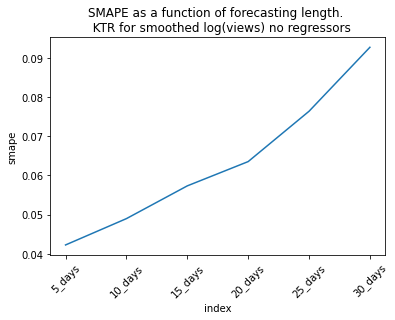

In [92]:
# plot SMAPE values over forecast length
sns.lineplot(data=evaluation_scores,
             x='index',
             y='smape',
            )
plt.xticks(rotation=45)
plt.title('SMAPE as a function of forecasting length. \n  KTR for smoothed log(views) no regressors')
plt.show()

- When forecasting for approximately 20 days, we observe a change in the behavior of the error - the error becomes higher for the same increase in forecast length (the nature of the growth changes).

- Let's set the forecast length to 3 weeks - 21 days.

Now, let's create a dataframe for forecasting the target values - 21 days ahead with three columns containing the predicted regressor values: the lower confidence interval boundary, the mean value, and the upper confidence interval boundary.


Make a prediction 21 days into the future first.

In [93]:
response_col = 'smooth_log_views_per_unique_post'
date_col = 'hour'
seasonality = [24, 168]
train_df = activity_metrics_hour
n_days = 21

In [94]:
# initialize a model
smooth_log_views_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=seasonality,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

# train and make a prediction
smooth_log_views_ktr.fit(train_df)

future_df = smooth_log_views_ktr.make_future_df(periods=24*n_days) 

predicted_df = smooth_log_views_ktr.predict(df=future_df, decompose=True)

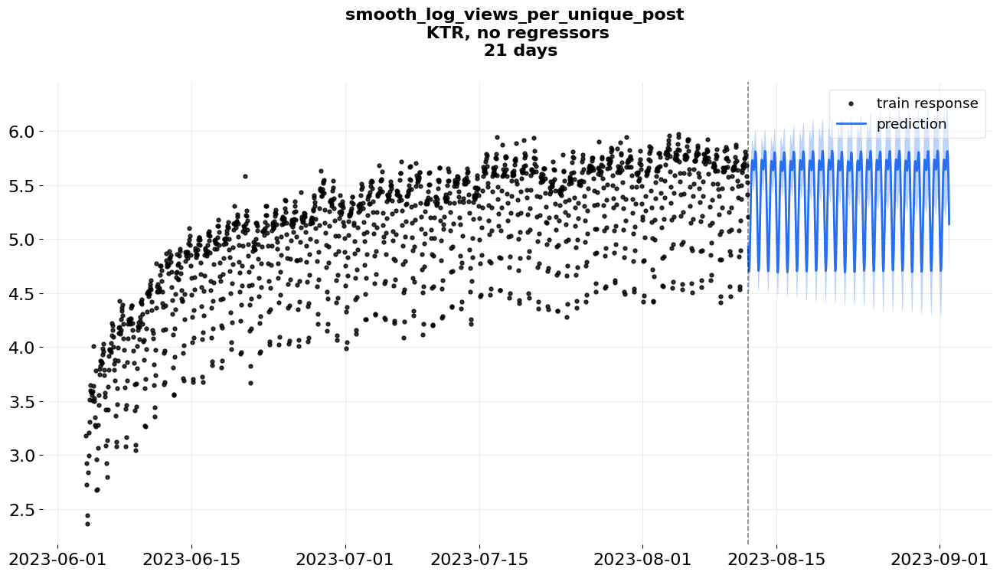

In [95]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n KTR, no regressors \n {n_days} days',
                       );

It's interesting that we lose the weekly seasonality when forecasting into the future.

Save the predicted values into a dataframe - we will need them later for target forecasts.

In [96]:
predicted_df.head()

,hour,prediction_5,prediction,prediction_95,trend_5,trend,trend_95,regression_5,regression,regression_95,seasonality_24_5,seasonality_24,seasonality_24_95,seasonality_168_5,seasonality_168,seasonality_168_95
0,2023-08-12 01:00:00,4.728,4.926,5.118,5.215,5.414,5.605,0.000,0.000,0.000,-0.488,-0.488,-0.488,0.001,0.001,0.001
1,2023-08-12 02:00:00,4.575,4.772,4.967,5.217,5.414,5.609,0.000,0.000,0.000,-0.642,-0.642,-0.642,0.001,0.001,0.001
2,2023-08-12 03:00:00,4.504,4.702,4.901,5.216,5.413,5.612,0.000,0.000,0.000,-0.712,-0.712,-0.712,0.001,0.001,0.001
3,2023-08-12 04:00:00,4.531,4.728,4.924,5.215,5.412,5.608,0.000,0.000,0.000,-0.685,-0.685,-0.685,0.001,0.001,0.001
4,2023-08-12 05:00:00,4.645,4.848,5.044,5.212,5.415,5.611,0.000,0.000,0.000,-0.568,-0.568,-0.568,0.001,0.001,0.001


In [97]:
regressor_df = predicted_df.iloc[:, :4]

regressor_df.tail()

,hour,prediction_5,prediction,prediction_95
499,2023-09-01 20:00:00,5.365,5.809,6.248
500,2023-09-01 21:00:00,5.277,5.722,6.171
501,2023-09-01 22:00:00,5.129,5.576,6.012
502,2023-09-01 23:00:00,4.914,5.365,5.811
503,2023-09-02 00:00:00,4.693,5.141,5.584


## 4. Forecasting target metric <a id="4-forecasting-target-metric"></a>


First, we will select the type of metric for the target metric - active users by hour (again "smoothed" on July 22nd):
- Users (standardized)

- Log of the number of users

Next, we'll see different forecasts for our target metric:
- without regressors,

- with the pessimistic regressor,
- with the optimistic regressor.

If we see that we're getting something average in the model without regressors, we discard it and rely only on models with regressors included.

We will also try out the DLT and KTR models.

Let's get a visual overview how the forecast looks.

### 4.1. target - no regressors - DLT <a id="4.1-target-no-regressors-dlt"></a>


In [98]:
# first, separate our df into train and split parts
n_days = 21
test_size=24 * n_days

train_df=activity_metrics_hour[:-test_size]
test_df=activity_metrics_hour[-test_size:]

In [99]:
date_col = 'hour'
seasonality = 24

In [100]:
# set our arguments for the model and a plot
response_col = 'smooth_z_scored_active_users'

In [101]:
# initialize a model
users_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

# train and make a prediction
users_dlt.fit(train_df)
predicted_df = users_dlt.predict(df=activity_metrics_hour, decompose=True)

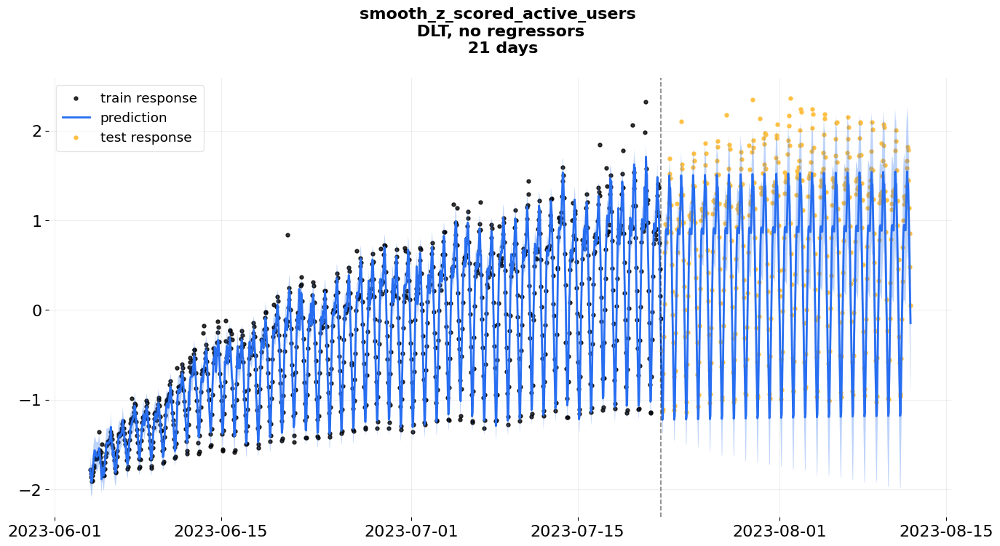

In [102]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

Let's do forecasting onto real future.

In [103]:
# train and make a prediction
users_dlt.fit(activity_metrics_hour)

future_df = users_dlt.make_future_df(periods=24*n_days) 
users_dlt_predicted = users_dlt.predict(df=future_df, decompose=True)

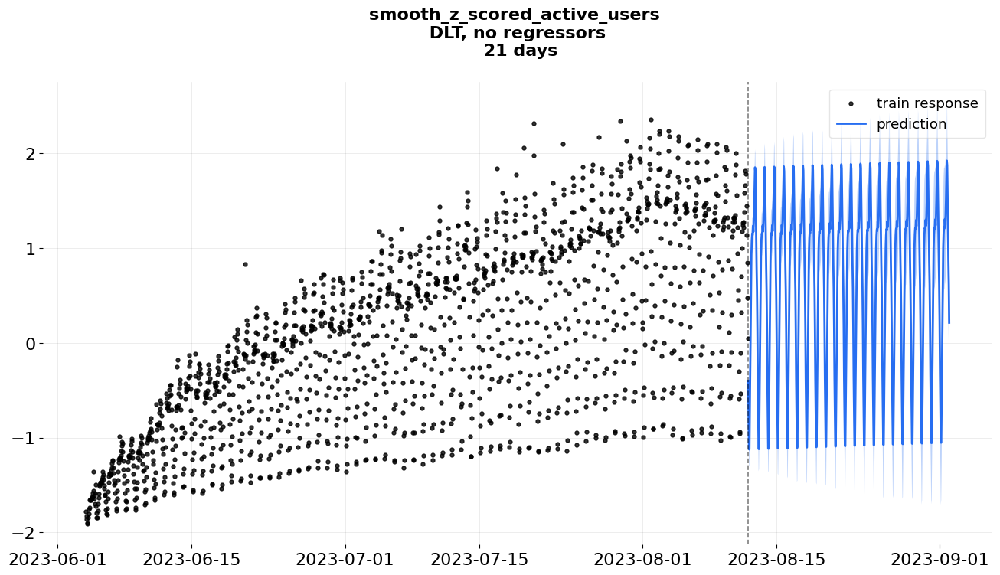

In [104]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=users_dlt_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

Let's see at the behaviour of log metric

### 4.2. log(users) - no regressors - DLT <a id="4.2-log-users-no-regressors-dlt"></a>


In [105]:
# set our arguments for the model and a plot
response_col = 'smooth_log_active_users'

In [106]:
# initialize a model
log_users_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

# train and make a prediction
log_users_dlt.fit(train_df)
predicted_df = log_users_dlt.predict(df=activity_metrics_hour, decompose=True)

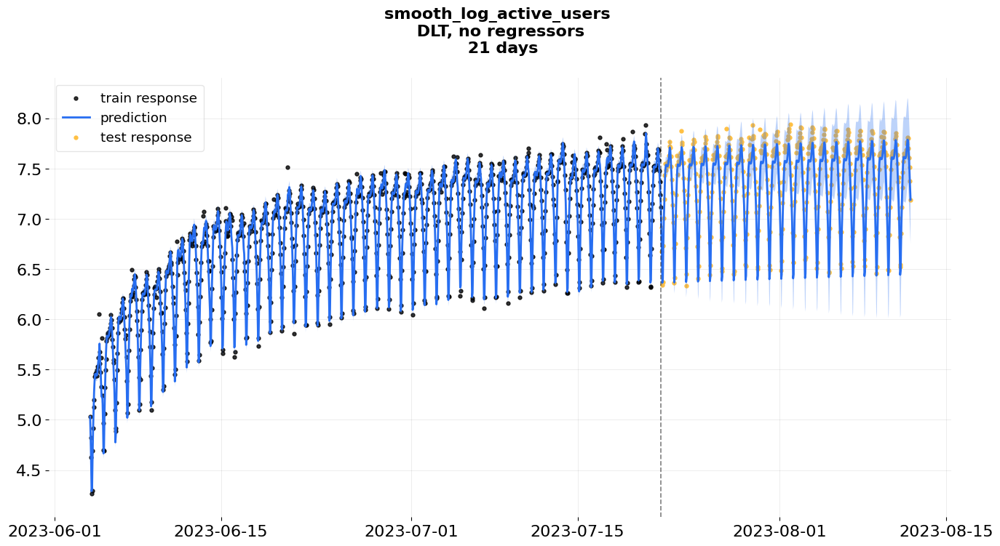

In [107]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

In [108]:
# train and make a prediction
log_users_dlt.fit(activity_metrics_hour)

future_df = log_users_dlt.make_future_df(periods=24*n_days) 
users_dlt_predicted = log_users_dlt.predict(df=future_df, decompose=True)

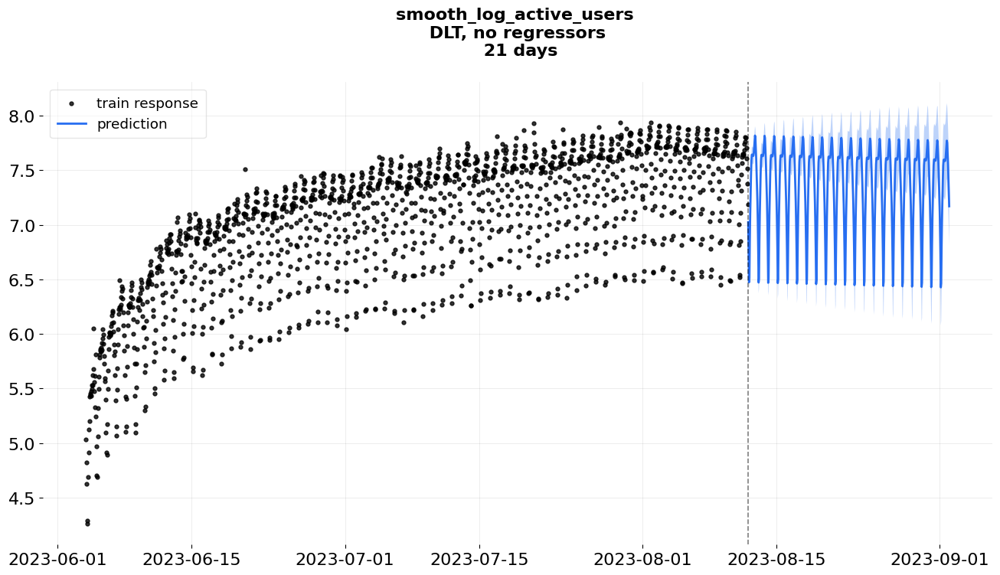

In [109]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=users_dlt_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

Instead of an increase (as in the case with standardized metrics), the forecast here is trending downwards.  
We will now conduct backtesting for these two combinations, find the best among them, and attempt to add regressors.

### 4.3. Choosing metric type for the target <a id="4.3-choosing-metric-type-for-the-target"></a>


In [110]:
forecast_len = 21

# create a backtester object
bt_obj = BackTester(
    model=users_dlt, 
    df=activity_metrics_hour, 
    min_train_len=24*7, 
    incremental_len=24*7, 
    forecast_len=24*forecast_len, 
    window_type="expanding" 
)

log_bt_obj = BackTester(
    model=log_users_dlt, 
    df=activity_metrics_hour,
    min_train_len=24*7, 
    incremental_len=24*7, 
    forecast_len=24*forecast_len, 
    window_type="expanding" 
)

In [111]:
bt_obj.fit_predict() # train
log_bt_obj.fit_predict()

In [112]:
predicted_df = bt_obj.get_predicted_df()
log_predicted_df = log_bt_obj.get_predicted_df()

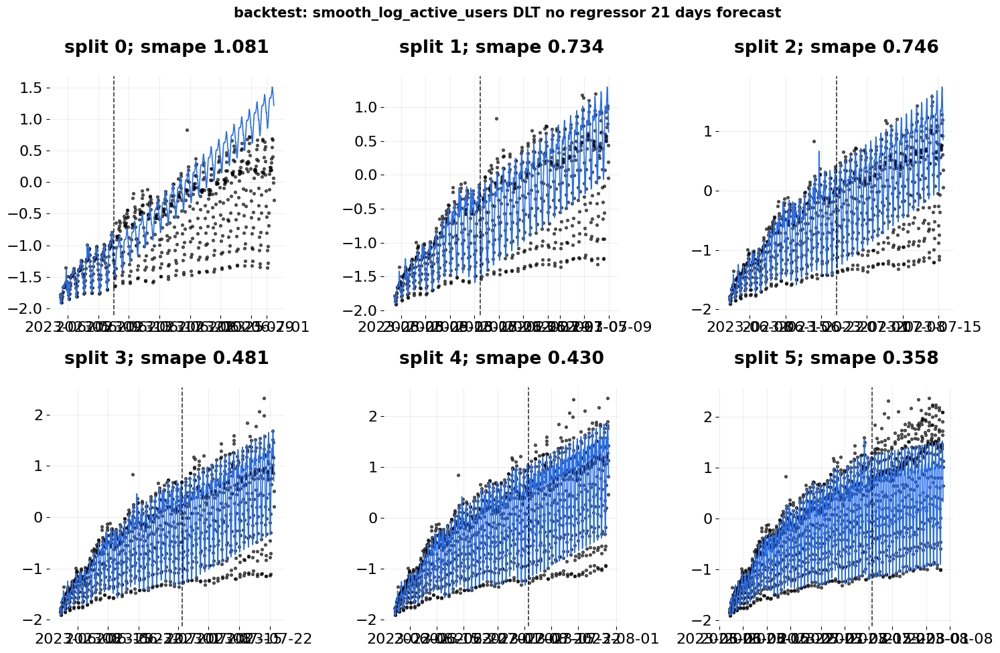

In [113]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: smooth_z_scored_active_users DLT no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

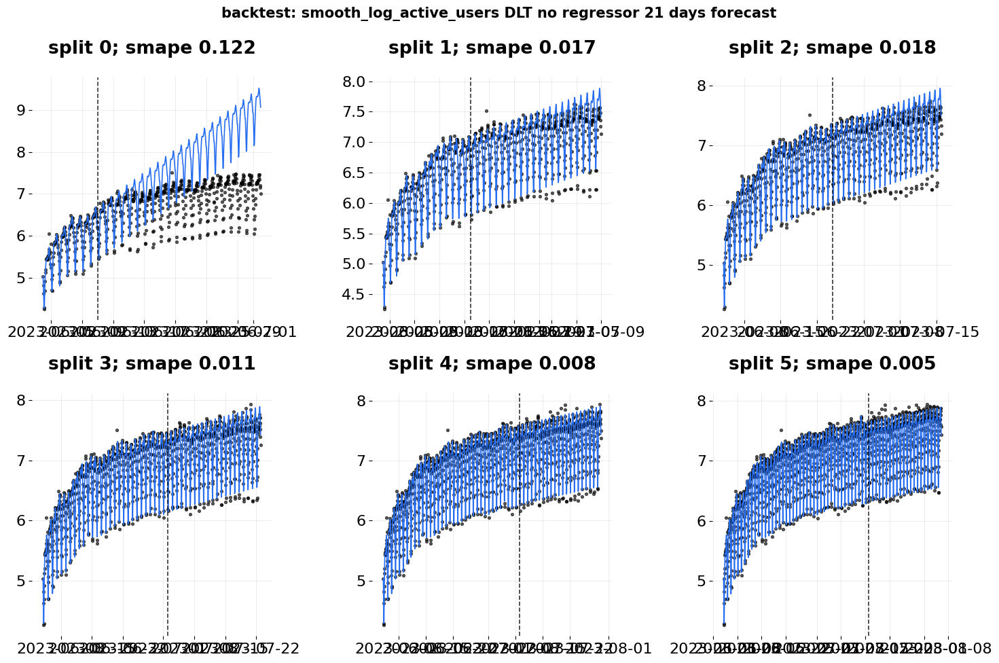

In [114]:
plot_bt_predictions(
    log_predicted_df, 
    title=f'backtest: smooth_log_active_users DLT no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

Let's continue with the logarithm - it seems to work better for more splits than the linear metric, which showed more realistic forecasts only on the last split.  
Will KTR work better here than DLT?


### 4.4. log(users) - no regressors - KTR <a id="4.4-log-users-no-regressors-ktr"></a>


In [115]:
# set our arguments for the model and a plot
response_col = 'smooth_log_active_users'

In [116]:
forecast_len = 21

# initialize a model
log_users_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=[24, 168],
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

bt_obj = BackTester(
    model=log_users_ktr, 
    df=activity_metrics_hour, 
    min_train_len=24*7, 
    incremental_len=24*7, 
    forecast_len=24*forecast_len, 
    window_type="expanding" 
)

In [117]:
bt_obj.fit_predict() # train

In [118]:
predicted_df = bt_obj.get_predicted_df()

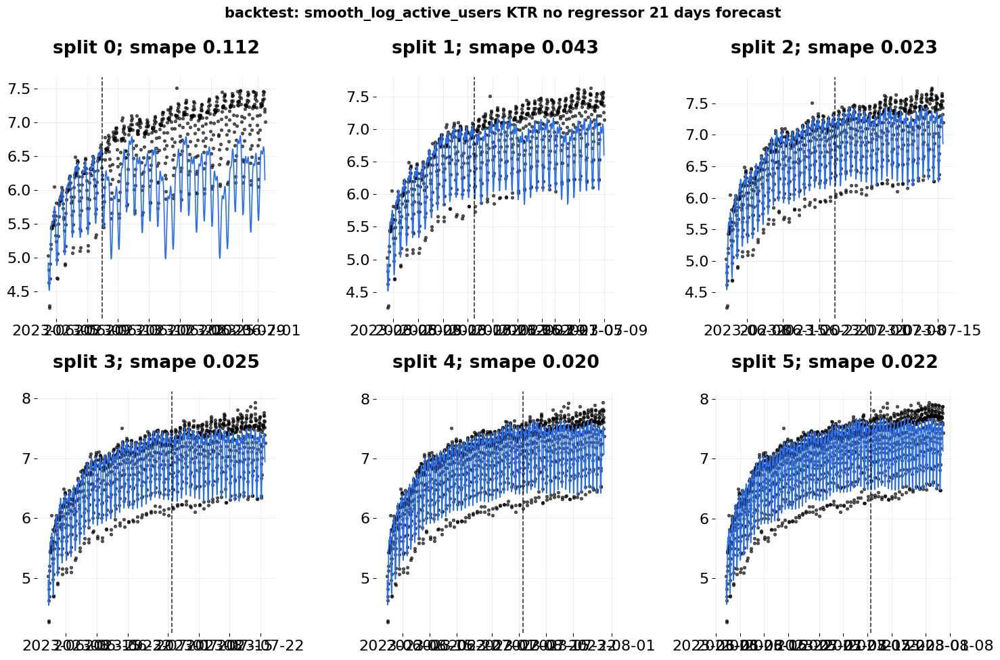

In [119]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: {response_col} KTR no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

and look how the future forecast looks like now

In [120]:
# train and make a prediction
log_users_ktr.fit(activity_metrics_hour);

In [121]:
future_df = log_users_ktr.make_future_df(periods=24*n_days) 
log_users_ktr_predicted = log_users_ktr.predict(df=future_df, decompose=True)

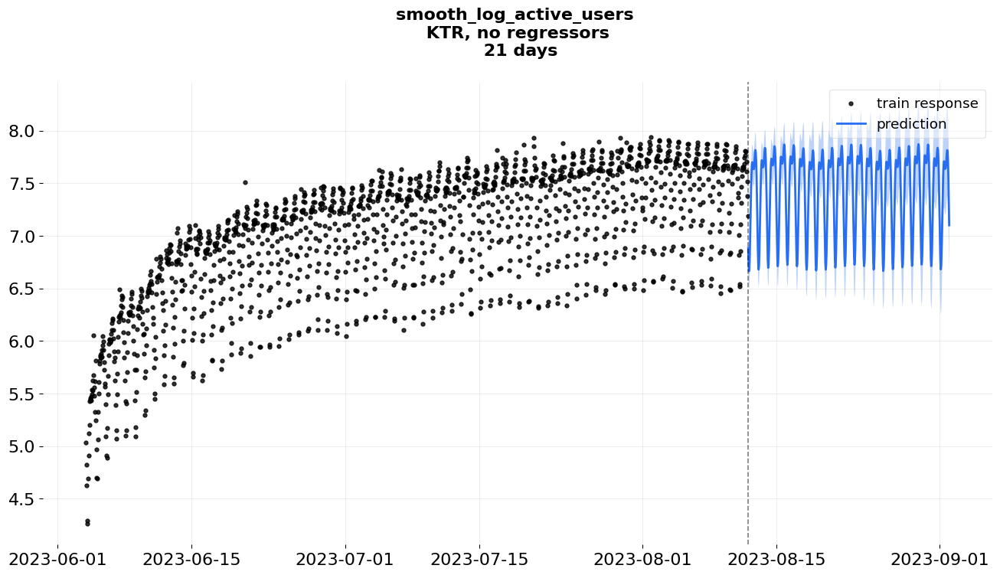

In [122]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=log_users_ktr_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n KTR, no regressors \n {n_days} days',
                       );

In [123]:
log_users_ktr_predicted.describe()

,hour,prediction_5,prediction,prediction_95,trend_5,trend,trend_95,regression_5,regression,regression_95,seasonality_24_5,seasonality_24,seasonality_24_95,seasonality_168_5,seasonality_168,seasonality_168_95
count,504,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000
mean,2023-08-22 12:30:00,7.117,7.421,7.723,7.117,7.421,7.723,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
min,2023-08-12 01:00:00,6.253,6.663,6.828,6.981,7.415,7.580,0.000,0.000,0.000,-0.726,-0.726,-0.726,-0.030,-0.030,-0.030
25%,2023-08-17 06:45:00,6.758,7.085,7.375,7.052,7.420,7.658,0.000,0.000,0.000,-0.318,-0.318,-0.318,-0.019,-0.019,-0.019
50%,2023-08-22 12:30:00,7.291,7.631,7.893,7.116,7.421,7.725,0.000,0.000,0.000,0.208,0.208,0.208,0.000,0.000,0.000
75%,2023-08-27 18:15:00,7.423,7.721,8.042,7.182,7.423,7.791,0.000,0.000,0.000,0.299,0.299,0.299,0.019,0.019,0.019
max,2023-09-02 00:00:00,7.661,7.870,8.261,7.254,7.431,7.860,0.000,0.000,0.000,0.419,0.419,0.419,0.030,0.030,0.030
std,NaN,0.392,0.386,0.397,0.079,0.002,0.080,0.000,0.000,0.000,0.386,0.386,0.386,0.020,0.020,0.020


Although the backtesting shows worse results for KTR, the trend looks more realistic and maintains weekly seasonality. Now, let's try adding regressors here.


### 4.5. log(users) - pessimistic regressor - KTR <a id="4.5-log-users-pessimistic-regressor-ktr"></a>


In [124]:
regressor_col = ['smooth_log_views_per_unique_post']

In [125]:
# initialize a model
log_users_reg_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=[24, 168],
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
    regressor_col=regressor_col,
)

In [126]:
# train and make a prediction
log_users_reg_ktr.fit(activity_metrics_hour);

In [127]:
# regressor_df has average and CI border predicted value
# for our smooth log views regressor
future_df = regressor_df.rename(
    columns={
        'prediction_5': 'smooth_log_views_per_unique_post'
    }
)

# make a forecast
log_users_reg_ktr_predicted = log_users_reg_ktr.predict(
    df=future_df.loc[:, ['hour', 'smooth_log_views_per_unique_post']], 
    decompose=True
)

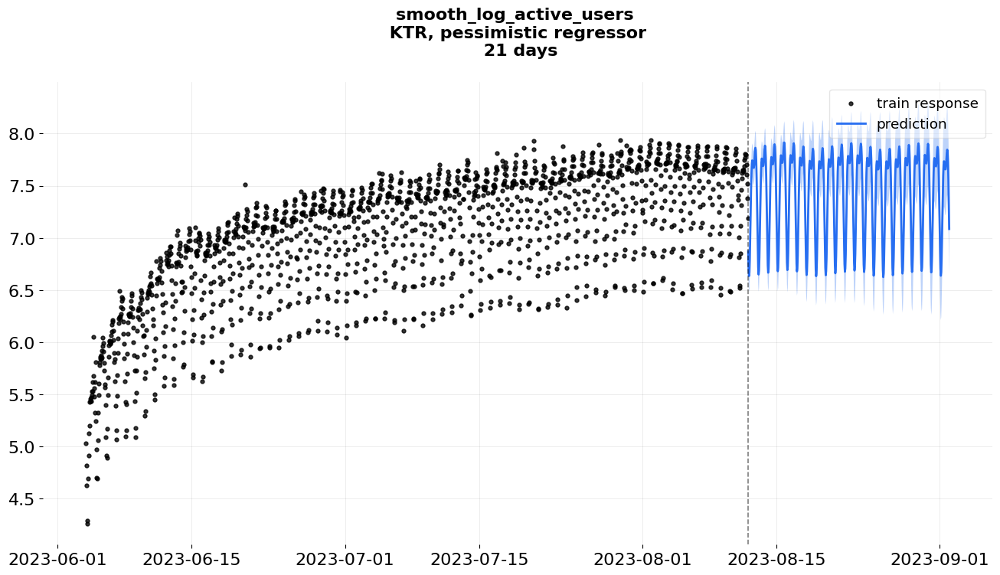

In [128]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=log_users_reg_ktr_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n KTR, pessimistic regressor \n {n_days} days',
                       );

In [129]:
log_users_reg_ktr_predicted.describe()

,hour,prediction_5,prediction,prediction_95,trend_5,trend,trend_95,regression_5,regression,regression_95,seasonality_24_5,seasonality_24,seasonality_24_95,seasonality_168_5,seasonality_168,seasonality_168_95
count,504,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000
mean,2023-08-22 12:30:00,7.132,7.434,7.732,6.780,7.082,7.380,0.332,0.352,0.375,0.000,0.000,0.000,0.000,0.000,0.000
min,2023-08-12 01:00:00,6.212,6.624,6.795,6.644,7.076,7.235,0.278,0.295,0.315,-0.726,-0.726,-0.726,-0.030,-0.030,-0.030
25%,2023-08-17 06:45:00,6.751,7.077,7.366,6.714,7.080,7.313,0.310,0.328,0.351,-0.318,-0.318,-0.318,-0.019,-0.019,-0.019
50%,2023-08-22 12:30:00,7.317,7.657,7.924,6.776,7.082,7.382,0.343,0.364,0.388,0.208,0.208,0.208,0.000,0.000,0.000
75%,2023-08-27 18:15:00,7.457,7.752,8.070,6.845,7.084,7.449,0.351,0.372,0.397,0.299,0.299,0.299,0.019,0.019,0.019
max,2023-09-02 00:00:00,7.712,7.914,8.291,6.920,7.091,7.517,0.365,0.387,0.414,0.419,0.419,0.419,0.030,0.030,0.030
std,NaN,0.418,0.412,0.422,0.080,0.003,0.081,0.025,0.026,0.028,0.386,0.386,0.386,0.020,0.020,0.020


### 4.6. smooth log target - optimistic regressor - KTR <a id="4.6-smooth-log-target-optimistic-regressor-ktr"></a>


In [130]:
# regressor_df has average and CI border predicted value
# for our smooth log views regressor
future_df = regressor_df.rename(
    columns={
        'prediction_95': 'smooth_log_views_per_unique_post'
    }
)

# make a forecast
log_users_reg_ktr_predicted = log_users_reg_ktr.predict(
    df=future_df.loc[:, ['hour', 'smooth_log_views_per_unique_post']], 
    decompose=True
)

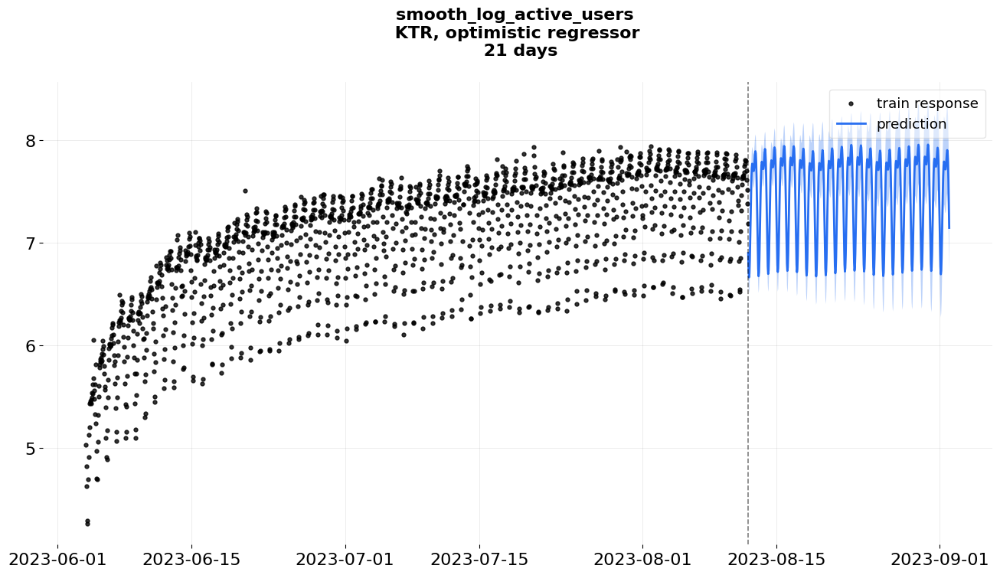

In [131]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=log_users_reg_ktr_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n KTR, optimistic regressor \n {n_days} days',
                       );

In [132]:
log_users_reg_ktr_predicted.describe()

,hour,prediction_5,prediction,prediction_95,trend_5,trend,trend_95,regression_5,regression,regression_95,seasonality_24_5,seasonality_24,seasonality_24_95,seasonality_168_5,seasonality_168,seasonality_168_95
count,504,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000
mean,2023-08-22 12:30:00,7.179,7.477,7.785,6.781,7.080,7.388,0.374,0.396,0.430,0.000,0.000,0.000,0.000,0.000,0.000
min,2023-08-12 01:00:00,6.273,6.662,6.823,6.650,7.073,7.237,0.319,0.338,0.367,-0.726,-0.726,-0.726,-0.030,-0.030,-0.030
25%,2023-08-17 06:45:00,6.810,7.122,7.413,6.716,7.079,7.319,0.353,0.374,0.406,-0.318,-0.318,-0.318,-0.019,-0.019,-0.019
50%,2023-08-22 12:30:00,7.371,7.698,7.960,6.778,7.080,7.390,0.385,0.408,0.443,0.208,0.208,0.208,0.000,0.000,0.000
75%,2023-08-27 18:15:00,7.509,7.795,8.124,6.845,7.081,7.461,0.393,0.417,0.453,0.299,0.299,0.299,0.019,0.019,0.019
max,2023-09-02 00:00:00,7.741,7.955,8.359,6.924,7.084,7.523,0.408,0.432,0.469,0.419,0.419,0.419,0.030,0.030,0.030
std,NaN,0.416,0.412,0.425,0.078,0.002,0.085,0.025,0.027,0.029,0.386,0.386,0.386,0.020,0.020,0.020


### 4.7. Choosing the model type and regressor type. <a id="4.7-choosing-the-model-type-and-regressor-type"></a>


- The difference between forecasts without regressors and with regressors is not very large.

- Nevertheless, let's choose the optimistic forecast and its upper confidence interval as the upper limit for server load - it's the highest estimate available in the current KTR model.
- Similarly, let's select the lower confidence interval of the pessimistic forecast as the lowest estimate.
- For the most likely scenario, we can use the mean of the forecast without regressors.


## 5. Conclusions <a id="5-conclusions"></a>


1. Initially, we chose active users per hour as the target metric to forecast server load. This metric reflected the load, had no strong anomalies in its dynamics, and displayed a predictable trend. Moreover, it had a pronounced daily seasonality and a weaker 7-day seasonality, which could assist us in making predictions; the logarithm of the metric demonstrated more stable forecasts than the standardized value.

2. As a potential regressor, we opted for either hourly or daily views on a unique post, as this metric correlated with the target and did not possess significant anomalies; the hourly metric also displayed daily and weekly seasonality. We discovered that the logarithm of the hourly metric was the best choice for our forecast and additionally incorporated a binary regressor to account for the anomalous spike in values due to a campaign.
3. For both metrics, we observed a significant drop in values on July 22nd, which was regarded as an outlier. Employing a corresponding binary regressor did not help - the presence of the drop still led to a strong negative forecast trend. As a result, we removed the outliers and replaced them with average values from July 21st and 23rd - the resulting metric was termed 'smooth'.
4. The utilization of the DLT model was generally not very fruitful - the resulting trends were too linear, steadily rising or falling, which might be associated with the metrics' multi-seasonality. Nevertheless, the use of KTR somewhat helped stabilize the trend and render the metrics more realistic.
5. We experimented with different forecast lengths and found that a 21-day forecast provides an optimal blend of time and error, whereas a 30-day forecast yielded less efficient estimates.
6. For this kind of model-time-regressor combination, we produced three types of forecasts depending on how our regressor metric behaves:
   - a 'low load' scenario where the minimum load over 21 days will reach 500 users per hour (lower bound of the confidence interval)
   - a 'medium load' scenario where the most probable load will amount to 2060 users per hour (forecast median)
   - a 'high load' scenario where the load will not exceed 4300 users per hour (upper bound of the confidence interval)
7. Nonetheless, this model has a limitation: we considered the July 22nd metric drop as an outlier and removed it, leading to a more positive trend in the forecasts. It's plausible that this decline represents a systemic event that could recur in the future, and in such a case, our forecast would be overestimating the data.
